# News Recommender System

## Buisness Problem


iPrint is an upcoming media house in India that offers media and information services to the people. The company’s business extends across a wide range of media, including news and information services on sports, weather, education, health, research, stocks and healthcare. Over the years, through its online application, iPrint has been efficiently delivering news and information to the common people.  However, with time and technological advancements, several new competitors of iPrint have emerged in the market. Hence, it has decided to begin providing a more personalised experience to its customers.

 

Till date, iPrint was managing its customer base by only recommending the most popular and similar news articles to what the user has already read or watched. However, the recommended news articles were often not relevant to the majority of the users. It was not able to recommend any new content to its customers, and gradually, the company started losing such users, which eventually resulted in immense revenue loss. 

 

iPrint being a cutting-edge company, is trying to solve this issue of revenue leakage by personalising user tastes and introducing new content to its users at the start of the day on the home page of the application. iPrint is planning to assess these recommendations by tracking whether the user clicks on those items or not. Moreover, once the user clicks on any news item A, it wants to recommend news similar to the news A, at the bottom of the page of the news item A. 

 

Now, let's understand what iPrint is trying to achieve here. By, recommending new items to the users at the start of the day, it is trying to understand if the user has new interests or not. Now, if the user clicks on the new item A and then also on subsequent items recommended at the bottom of the news item A, then iPrint can infer that the topic/ genre of the new item is something of user interest.

 

### Problem Statement

problem statement can be divided into two parts discussed below. Of the numerous news articles available on its app about sports, politics, technology and many others, iPrint wants you as a data scientist to identify and build an appropriate recommendation system that would:

Recommend new top 10 relevant articles to a user when he visits the app at the start of the day
- Recommend top 10 similar news articles that match the ones clicked by the user. 
- Try different models for generating these recommendations and experiment with hybrid models for the same

You have to ensure that the system does not recommend any news article that has been pulled out from the app or has already been seen by the user. In addition, only the articles that are written in the English language must be considered for content-based recommendations. The final generated list must contain the names of the recommended articles, along with their IDs.

# Step 1: Import and Inspect Data

In [286]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Consumer Data

In [287]:
consumer_df=pd.read_csv(r"consumer_transanctions.csv") #importing data
consumer_df.head() #check the 5 top rows

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/52...",NY,US
2,1465416190,content_watched,310515487419366995,-1130272294246983140,2631864456530402479,NaN,NaN,NaN
3,1465413895,content_followed,310515487419366995,344280948527967603,-3167637573980064150,NaN,NaN,NaN
4,1465412290,content_watched,-7820640624231356730,-445337111692715325,561148 1178424124714,NaN,NaN,NaN


In [288]:
consumer_df.shape #shape of dataset

(72312, 8)

In [289]:
consumer_df.describe() #check the data stats

,event_timestamp,item_id,consumer_id
count,7.231200e+04,7.231200e+04,7.231200e+04
mean,1.470103e+09,-3.033423e+16,1.252026e+16
std,7.258130e+06,5.344755e+18,5.022333e+18
min,1.457964e+09,-9.222795e+18,-9.223122e+18
25%,1.464876e+09,-4.726309e+18,-3.596627e+18
50%,1.468343e+09,1.893099e+16,-1.088422e+17
75%,1.474461e+09,4.441012e+18,3.766319e+18
max,1.488310e+09,9.222265e+18,9.210531e+18


In [290]:
consumer_df.info() #check the columns and info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72312 entries, 0 to 72311
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   event_timestamp       72312 non-null  int64 
 1   interaction_type      72312 non-null  object
 2   item_id               72312 non-null  int64 
 3   consumer_id           72312 non-null  int64 
 4   consumer_session_id   72312 non-null  object
 5   consumer_device_info  56918 non-null  object
 6   consumer_location     56907 non-null  object
 7   country               56918 non-null  object
dtypes: int64(3), object(5)
memory usage: 4.4+ MB


In [291]:
consumer_df.columns #columns in Dataset 

Index(['event_timestamp', 'interaction_type', 'item_id', 'consumer_id',
       'consumer_session_id', 'consumer_device_info', 'consumer_location',
       'country'],
      dtype='object')

In [292]:
consumer_df['interaction_type'].value_counts()

content_watched         61086
content_liked            5745
content_saved            2463
content_commented_on     1611
content_followed         1407
Name: interaction_type, dtype: int64

#### creating a new column for 'ratings' 
We shall impute the rating values based on the feature ‘interaction type’ with the highest weightage to content_followed, followed by content_commented_on, content saved, content liked and content_watched.

In [293]:
#### creating a new column for 'ratings' 
consumer_df['ratings']=consumer_df['interaction_type'].map({'content_followed':5,'content_commented_on':4, 'content_saved':3, 'content_liked':2, 'content_watched':1})

In [294]:
consumer_df.head(5)

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country,ratings
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN,1
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/52...",NY,US,1
2,1465416190,content_watched,310515487419366995,-1130272294246983140,2631864456530402479,NaN,NaN,NaN,1
3,1465413895,content_followed,310515487419366995,344280948527967603,-3167637573980064150,NaN,NaN,NaN,5
4,1465412290,content_watched,-7820640624231356730,-445337111692715325,561148 1178424124714,NaN,NaN,NaN,1


<AxesSubplot:xlabel='country', ylabel='count'>

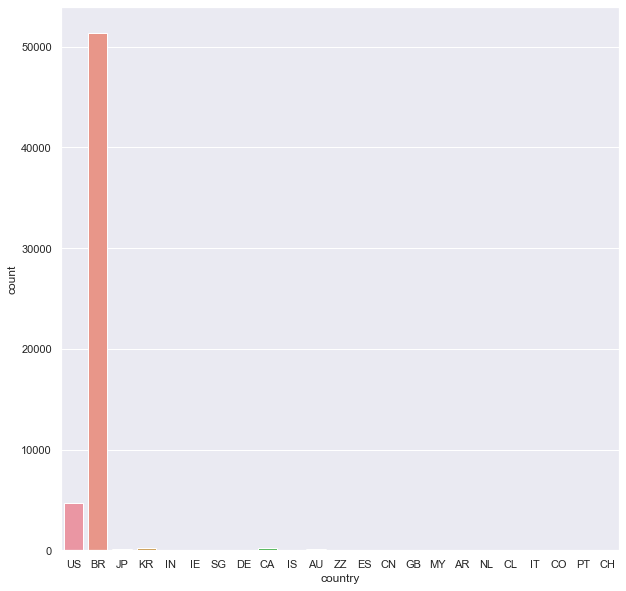

In [295]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(10,10))
sns.countplot(x="country", data=consumer_df)

#### _`Inference`_: 
- Looks like BR is the most popular country it consumes greater than 50000 articles.
- The next popular country is the US

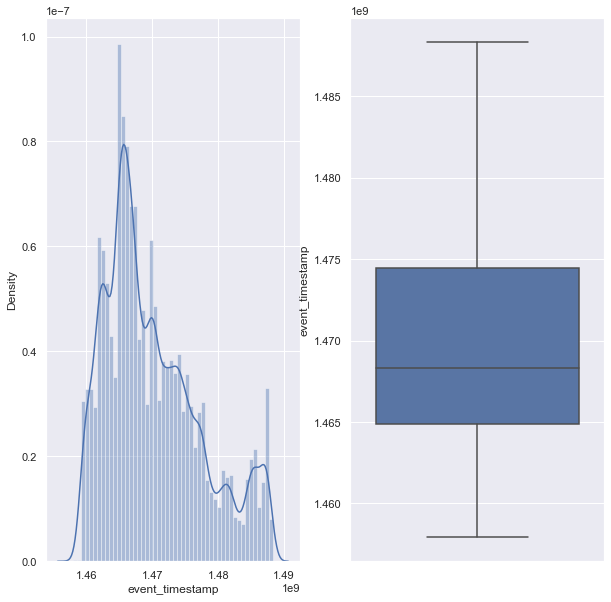

In [296]:

plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
sns.distplot(consumer_df['event_timestamp']) #ploting dist plot for cnt

plt.subplot(1,2,2)
sns.boxplot(y=consumer_df['event_timestamp'])#boxplot dist plot for cnt

plt.show()

#### _`Inference`_: 
- Most of the users time stamp is between 1.465 and 1.470

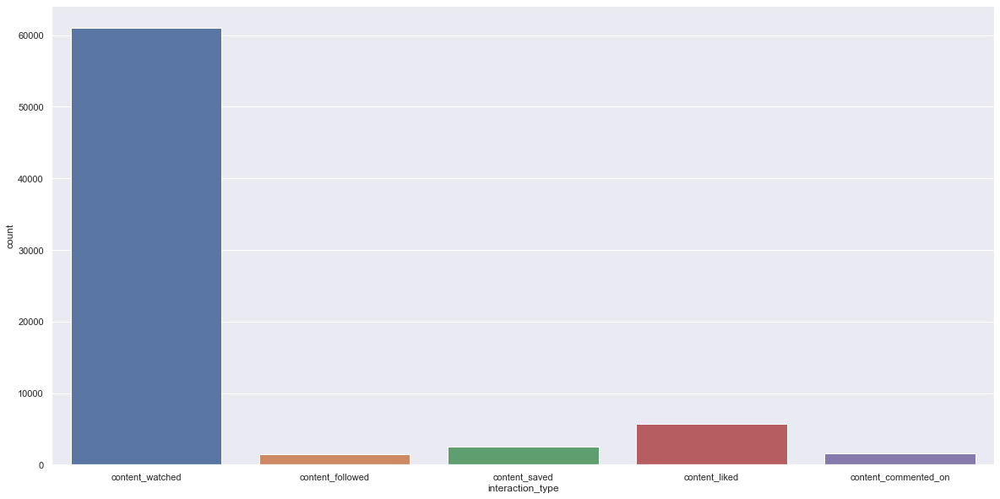

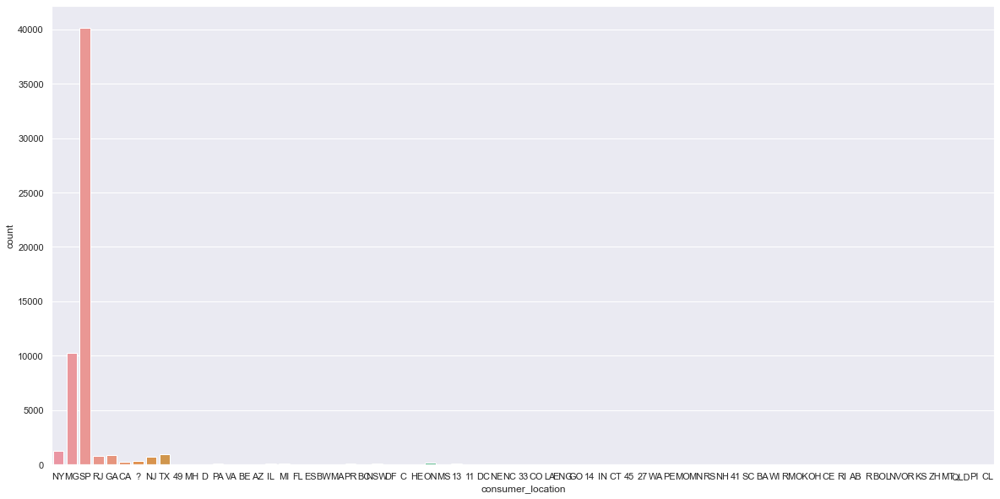

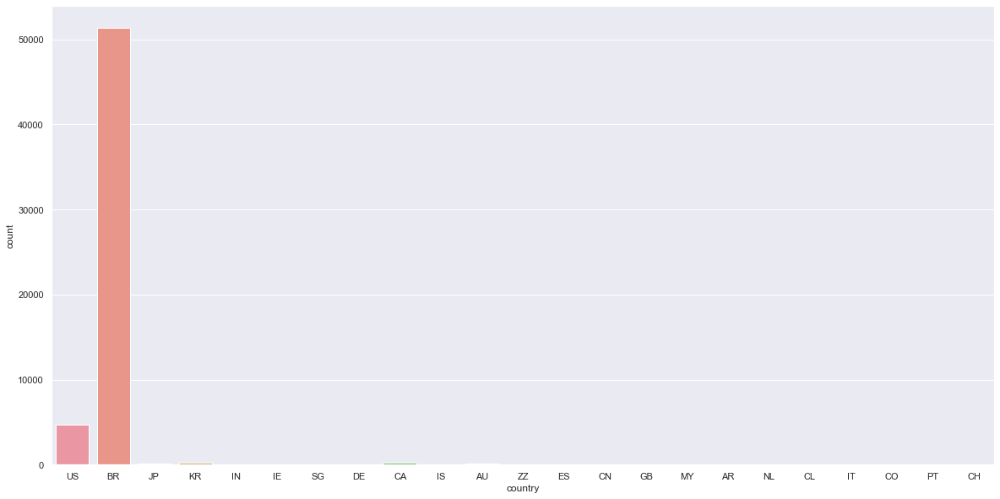

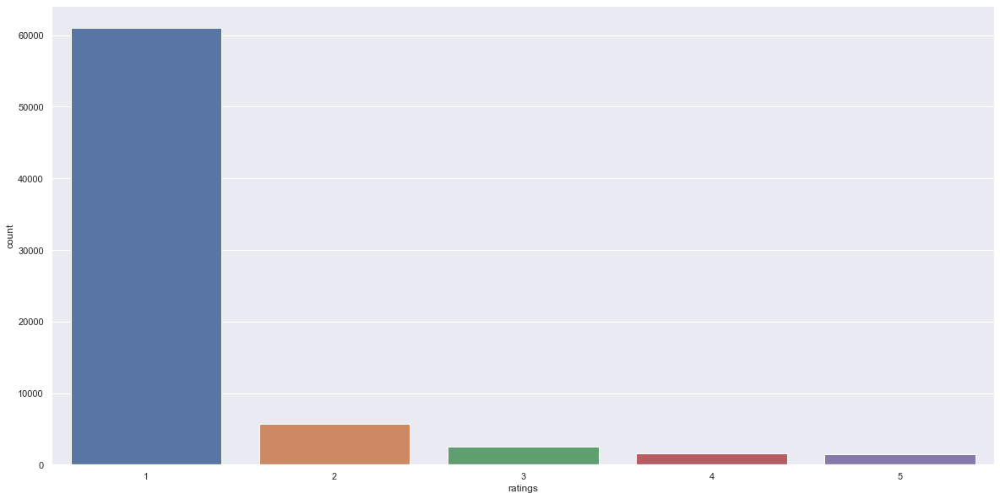

In [297]:
#function for barplot for categorical variables 
var_cat =['interaction_type','consumer_location','country','ratings']

for i in range(0,len(var_cat)):
    plt.figure(figsize=(20,10))
    sns.countplot(x=var_cat[i], data=consumer_df)
    plt.show()
    

    

#### _`Inference`_: 
- Most users have watched the content
- Customers from NY, MG, SP, RA, GA, TX, NJ are the highest



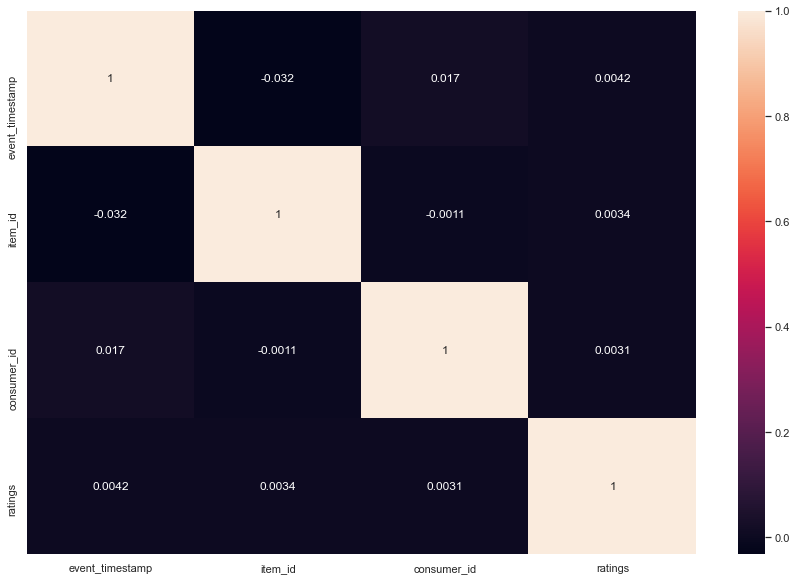

In [298]:
#Finding Correlation using heatmap
plt.figure(figsize=(15,10))
sns.heatmap(consumer_df.corr(), annot = True)
plt.show()

_____________________________________________________________________________________________________________________________________________

### Platform Content Data

In [299]:
platform_content=pd.read_csv(r"platform_content.csv") #importing data
platform_content.head() #check the 5 top rows

,event_timestamp,interaction_type,item_id,producer_id,producer_session_id,producer_device_info,producer_location,producer_country,item_type,item_url,title,text_description,language
0,1459192779,content_pulled_out,-6451309518266745024,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dealbook/ethereum-a-virtual-currency-enables-transact...,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's",All of this work is still very early. The first full public version of the Ethereum software was...,en
1,1459193988,content_present,-4110354420726924665,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dealbook/ethereum-a-virtual-currency-enables-transact...,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's",All of this work is still very early. The first full public version of the Ethereum software was...,en
2,1459194146,content_present,-7292285110016212249,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://cointelegraph.com/news/bitcoin-future-when-gbpcoin-of-branson-wins-over-usdcoin-of-trump,Bitcoin Future: When GBPcoin of Branson Wins Over USDcoin of Trump,"The alarm clock wakes me at 8:00 with stream of advert-free broadcasting, charged at one satoshi...",en
3,1459194474,content_present,-6151852268067518688,3891637997717104548,-1457532940883382585,NaN,NaN,NaN,HTML,https://cloudplatform.googleblog.com/2016/03/Google-Data-Center-360-Tour.html,Google Data Center 360° Tour,We're excited to share the Google Data Center 360° Tour - a YouTube 360° video that gives you an...,en
4,1459194497,content_present,2448026894306402386,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,https://bitcoinmagazine.com/articles/ibm-wants-to-evolve-the-internet-with-blockchain-technology...,"IBM Wants to ""Evolve the Internet"" With Blockchain Technology",The Aite Group projects the blockchain market could be valued at $400 million by 2019. For that ...,en


In [300]:
platform_content.head(5)

,event_timestamp,interaction_type,item_id,producer_id,producer_session_id,producer_device_info,producer_location,producer_country,item_type,item_url,title,text_description,language
0,1459192779,content_pulled_out,-6451309518266745024,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dealbook/ethereum-a-virtual-currency-enables-transact...,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's",All of this work is still very early. The first full public version of the Ethereum software was...,en
1,1459193988,content_present,-4110354420726924665,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dealbook/ethereum-a-virtual-currency-enables-transact...,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's",All of this work is still very early. The first full public version of the Ethereum software was...,en
2,1459194146,content_present,-7292285110016212249,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://cointelegraph.com/news/bitcoin-future-when-gbpcoin-of-branson-wins-over-usdcoin-of-trump,Bitcoin Future: When GBPcoin of Branson Wins Over USDcoin of Trump,"The alarm clock wakes me at 8:00 with stream of advert-free broadcasting, charged at one satoshi...",en
3,1459194474,content_present,-6151852268067518688,3891637997717104548,-1457532940883382585,NaN,NaN,NaN,HTML,https://cloudplatform.googleblog.com/2016/03/Google-Data-Center-360-Tour.html,Google Data Center 360° Tour,We're excited to share the Google Data Center 360° Tour - a YouTube 360° video that gives you an...,en
4,1459194497,content_present,2448026894306402386,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,https://bitcoinmagazine.com/articles/ibm-wants-to-evolve-the-internet-with-blockchain-technology...,"IBM Wants to ""Evolve the Internet"" With Blockchain Technology",The Aite Group projects the blockchain market could be valued at $400 million by 2019. For that ...,en


In [301]:
platform_content.shape #checking shape

(3122, 13)

In [302]:
platform_content.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3122 entries, 0 to 3121
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   event_timestamp       3122 non-null   int64 
 1   interaction_type      3122 non-null   object
 2   item_id               3122 non-null   int64 
 3   producer_id           3122 non-null   int64 
 4   producer_session_id   3122 non-null   int64 
 5   producer_device_info  680 non-null    object
 6   producer_location     680 non-null    object
 7   producer_country      680 non-null    object
 8   item_type             3122 non-null   object
 9   item_url              3122 non-null   object
 10  title                 3122 non-null   object
 11  text_description      3122 non-null   object
 12  language              3122 non-null   object
dtypes: int64(4), object(9)
memory usage: 317.2+ KB


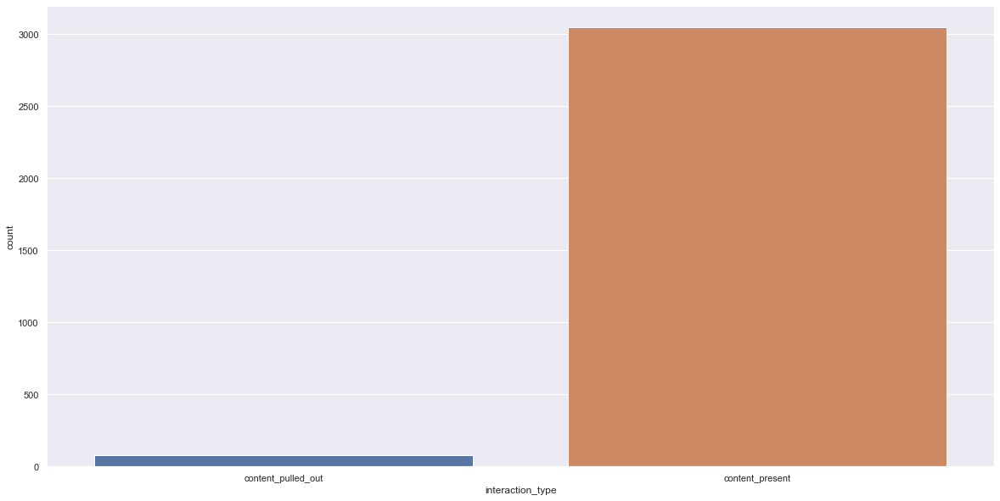

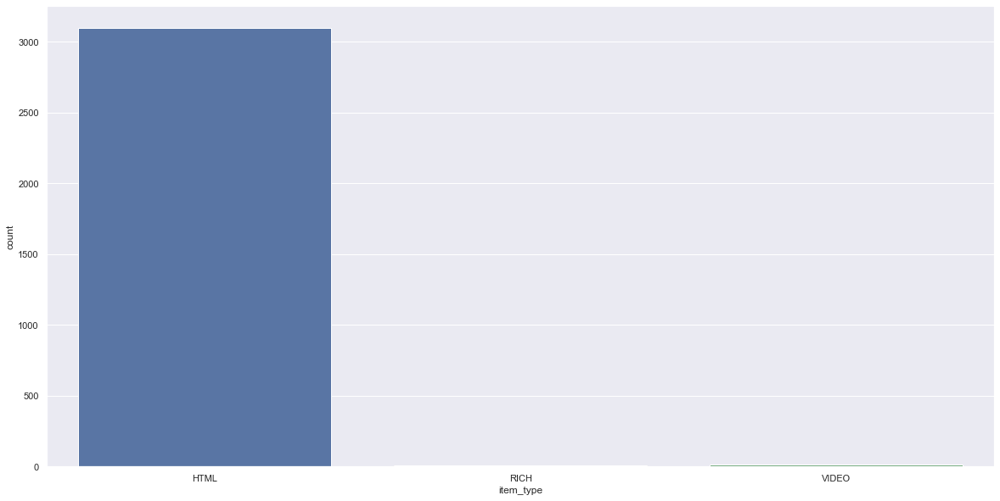

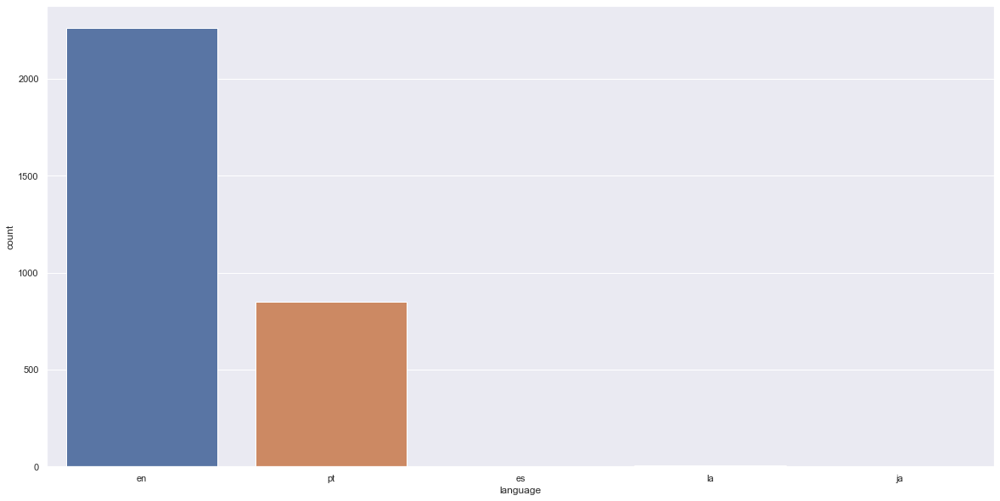

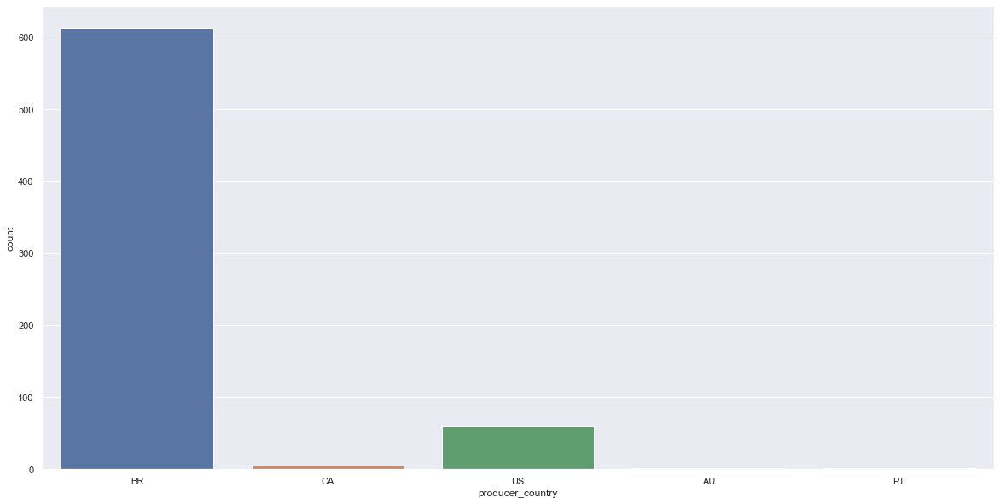

In [303]:
#function for barplot for categorical variables 
var_cat =['interaction_type','item_type','language','producer_country']

for i in range(0,len(var_cat)):
    plt.figure(figsize=(20,10))
    sns.countplot(x=var_cat[i], data=platform_content)
    plt.show()
    

    

#### _`Inference`_: 
- We can see that a few items are pulled out, around 100.
- Most of the item type is HTML
- English seems to be most popular followed by Pt (portugese)
- Most producers are from BR and then US


In [304]:
platform_content.describe()

,event_timestamp,item_id,producer_id,producer_session_id
count,3.122000e+03,3.122000e+03,3.122000e+03,3.122000e+03
mean,1.468804e+09,3.284110e+16,3.984819e+17,1.976675e+17
std,7.571512e+06,5.383734e+18,4.387115e+18,5.403753e+18
min,1.459193e+09,-9.222795e+18,-9.120686e+18,-9.212055e+18
25%,1.462369e+09,-4.660869e+18,-1.578288e+18,-4.651280e+18
50%,1.467136e+09,4.436584e+16,-7.092877e+17,4.154103e+17
75%,1.473873e+09,4.745617e+18,3.609194e+18,4.841644e+18
max,1.488308e+09,9.222265e+18,9.210531e+18,9.221043e+18


In [305]:
platform_content['language'].value_counts() #check the language and the count

en    2264
pt     850
la       4
es       2
ja       2
Name: language, dtype: int64

#### _`Inference`_: 
- Most of the articles are in en (english)
- The second most used language is pt (Portuguese)



In [306]:
platform_content.nunique()

event_timestamp         3121
interaction_type           2
item_id                 3057
producer_id              252
producer_session_id     2017
producer_device_info     114
producer_location         19
producer_country           5
item_type                  3
item_url                3029
title                   3011
text_description        3019
language                   5
dtype: int64

### We will only use english language based articles for our recomendation 

In [307]:
platform_content_en = platform_content[platform_content.language == 'en'] #choosing only english

In [308]:
platform_content_en.shape #checking final df rows and clms 

(2264, 13)

In [309]:
platform_content_en['interaction_type'].value_counts()

content_present       2211
content_pulled_out      53
Name: interaction_type, dtype: int64

In [310]:
pulled_out_df= platform_content_en[platform_content_en.interaction_type == 'content_pulled_out']#df of conent pulled out

In [311]:
pulled_out=list(pulled_out_df['item_id'])

In [312]:
pulled_out#pulled out IDs

[-6451309518266745024,
 8078873160882064481,
 -7356135999773525293,
 7420742904084384944,
 8219310215587599928,
 -6499865726739947794,
 2293315701090958124,
 8160885002406274828,
 -4248528062574538011,
 -3265730906936163775,
 2824996248683640175,
 -9153494109165200346,
 756136904399885845,
 8497861351486449784,
 -2990485643677949494,
 -2990485643677949494,
 -1312850681127865433,
 -4187268503708157132,
 -456574518348806233,
 4739732607073456292,
 -8112397019636931887,
 -1706114177222872702,
 7078276984547732873,
 -6878119266243511199,
 1433951803438448289,
 -4068545238978420047,
 4315784099325221836,
 -3114161754347804356,
 9033884391004475493,
 -1172724258904585136,
 5322532051893153382,
 -8449536481786923901,
 8200662919796009914,
 8962537427807366481,
 -9102431381393428051,
 -7568926158048616650,
 3823268327704412514,
 365571143597993923,
 476793294516827044,
 -2377881752614744441,
 3884256359744615997,
 4106497696154898573,
 8381798621267347902,
 7251252752220327534,
 -5808672937983

In [313]:
# we also don't need the articles where they were pulled out, there are 53 such articles
platform_content_en = platform_content_en[platform_content_en.interaction_type != 'content_pulled_out']

In [314]:
platform_content_en.shape 

(2211, 13)

In [315]:
platform_content_en.head(5) # 5 rows

,event_timestamp,interaction_type,item_id,producer_id,producer_session_id,producer_device_info,producer_location,producer_country,item_type,item_url,title,text_description,language
1,1459193988,content_present,-4110354420726924665,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dealbook/ethereum-a-virtual-currency-enables-transact...,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's",All of this work is still very early. The first full public version of the Ethereum software was...,en
2,1459194146,content_present,-7292285110016212249,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://cointelegraph.com/news/bitcoin-future-when-gbpcoin-of-branson-wins-over-usdcoin-of-trump,Bitcoin Future: When GBPcoin of Branson Wins Over USDcoin of Trump,"The alarm clock wakes me at 8:00 with stream of advert-free broadcasting, charged at one satoshi...",en
3,1459194474,content_present,-6151852268067518688,3891637997717104548,-1457532940883382585,NaN,NaN,NaN,HTML,https://cloudplatform.googleblog.com/2016/03/Google-Data-Center-360-Tour.html,Google Data Center 360° Tour,We're excited to share the Google Data Center 360° Tour - a YouTube 360° video that gives you an...,en
4,1459194497,content_present,2448026894306402386,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,https://bitcoinmagazine.com/articles/ibm-wants-to-evolve-the-internet-with-blockchain-technology...,"IBM Wants to ""Evolve the Internet"" With Blockchain Technology",The Aite Group projects the blockchain market could be valued at $400 million by 2019. For that ...,en
5,1459194522,content_present,-2826566343807132236,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.coindesk.com/ieee-blockchain-oxford-cloud-computing/,IEEE to Talk Blockchain at Cloud Computing Oxford-Con - CoinDesk,One of the largest and oldest organizations for computing professionals will kick off its annual...,en


In [316]:
platform_content_en['language'].value_counts() #check the language and the count

en    2211
Name: language, dtype: int64

In [317]:
platform_content_en.isna().sum() #check the null values for columns 

event_timestamp            0
interaction_type           0
item_id                    0
producer_id                0
producer_session_id        0
producer_device_info    1744
producer_location       1744
producer_country        1744
item_type                  0
item_url                   0
title                      0
text_description           0
language                   0
dtype: int64

#### _`Inference`_: 
- None of the columns that would directly influence the recommendation have null values 



______________________________________________________________________________________________________________________________________________________________

## CONTENT BASED FILTERING

- We will use the platform data for content based filtering.
- The text_description will be used for keyword.




In [318]:
from nltk.corpus import stopwords #import stopwords from nltk 

In [319]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer

pd.set_option('max_colwidth', 100)

In [320]:
# Count duplicate on a column
platform_content_en.duplicated().sum()

0

#### _`Inference`_: 
- No duplicate rows. 



In [321]:
df_keywords = platform_content_en[['item_id','title','text_description']]

In [322]:
df_keywords.head(5)

,item_id,title,text_description
1,-4110354420726924665,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's",All of this work is still very early. The first full public version of the Ethereum software was...
2,-7292285110016212249,Bitcoin Future: When GBPcoin of Branson Wins Over USDcoin of Trump,"The alarm clock wakes me at 8:00 with stream of advert-free broadcasting, charged at one satoshi..."
3,-6151852268067518688,Google Data Center 360° Tour,We're excited to share the Google Data Center 360° Tour - a YouTube 360° video that gives you an...
4,2448026894306402386,"IBM Wants to ""Evolve the Internet"" With Blockchain Technology",The Aite Group projects the blockchain market could be valued at $400 million by 2019. For that ...
5,-2826566343807132236,IEEE to Talk Blockchain at Cloud Computing Oxford-Con - CoinDesk,One of the largest and oldest organizations for computing professionals will kick off its annual...


In [323]:
df_keywords['keywords'] = df_keywords['text_description']

In [324]:
df_keywords.head(5)

,item_id,title,text_description,keywords
1,-4110354420726924665,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's",All of this work is still very early. The first full public version of the Ethereum software was...,All of this work is still very early. The first full public version of the Ethereum software was...
2,-7292285110016212249,Bitcoin Future: When GBPcoin of Branson Wins Over USDcoin of Trump,"The alarm clock wakes me at 8:00 with stream of advert-free broadcasting, charged at one satoshi...","The alarm clock wakes me at 8:00 with stream of advert-free broadcasting, charged at one satoshi..."
3,-6151852268067518688,Google Data Center 360° Tour,We're excited to share the Google Data Center 360° Tour - a YouTube 360° video that gives you an...,We're excited to share the Google Data Center 360° Tour - a YouTube 360° video that gives you an...
4,2448026894306402386,"IBM Wants to ""Evolve the Internet"" With Blockchain Technology",The Aite Group projects the blockchain market could be valued at $400 million by 2019. For that ...,The Aite Group projects the blockchain market could be valued at $400 million by 2019. For that ...
5,-2826566343807132236,IEEE to Talk Blockchain at Cloud Computing Oxford-Con - CoinDesk,One of the largest and oldest organizations for computing professionals will kick off its annual...,One of the largest and oldest organizations for computing professionals will kick off its annual...


## convert to numpy arrays

In [325]:
keywords_array = df_keywords['keywords'].to_numpy() #creating a numpy array of the keywords

In [326]:
keywords_array[:10]

array(['All of this work is still very early. The first full public version of the Ethereum software was recently released, and the system could face some of the same technical and legal problems that have tarnished Bitcoin. Many Bitcoin advocates say Ethereum will face more security problems than Bitcoin because of the greater complexity of the software. Thus far, Ethereum has faced much less testing, and many fewer attacks, than Bitcoin. The novel design of Ethereum may also invite intense scrutiny by authorities given that potentially fraudulent contracts, like the Ponzi schemes, can be written directly into the Ethereum system. But the sophisticated capabilities of the system have made it fascinating to some executives in corporate America. IBM said last year that it was experimenting with Ethereum as a way to control real world objects in the so-called Internet of things. Microsoft has been working on several projects that make it easier to use Ethereum on its computing cloud, Azu

In [327]:
len(keywords_array)

2211

In [328]:
df_keywords.shape

(2211, 4)

In [329]:
keywords_array[0] #1st row of thr array

'All of this work is still very early. The first full public version of the Ethereum software was recently released, and the system could face some of the same technical and legal problems that have tarnished Bitcoin. Many Bitcoin advocates say Ethereum will face more security problems than Bitcoin because of the greater complexity of the software. Thus far, Ethereum has faced much less testing, and many fewer attacks, than Bitcoin. The novel design of Ethereum may also invite intense scrutiny by authorities given that potentially fraudulent contracts, like the Ponzi schemes, can be written directly into the Ethereum system. But the sophisticated capabilities of the system have made it fascinating to some executives in corporate America. IBM said last year that it was experimenting with Ethereum as a way to control real world objects in the so-called Internet of things. Microsoft has been working on several projects that make it easier to use Ethereum on its computing cloud, Azure. "Et

## Split keywords & create word list

In [330]:
words_list = []

for keyword in keywords_array:
    
    splitted_words = str(keyword).lower().split() #split words and convert to lowercase
    
    words_list.append(splitted_words)

In [331]:
words_list

[['all',
  'of',
  'this',
  'work',
  'is',
  'still',
  'very',
  'early.',
  'the',
  'first',
  'full',
  'public',
  'version',
  'of',
  'the',
  'ethereum',
  'software',
  'was',
  'recently',
  'released,',
  'and',
  'the',
  'system',
  'could',
  'face',
  'some',
  'of',
  'the',
  'same',
  'technical',
  'and',
  'legal',
  'problems',
  'that',
  'have',
  'tarnished',
  'bitcoin.',
  'many',
  'bitcoin',
  'advocates',
  'say',
  'ethereum',
  'will',
  'face',
  'more',
  'security',
  'problems',
  'than',
  'bitcoin',
  'because',
  'of',
  'the',
  'greater',
  'complexity',
  'of',
  'the',
  'software.',
  'thus',
  'far,',
  'ethereum',
  'has',
  'faced',
  'much',
  'less',
  'testing,',
  'and',
  'many',
  'fewer',
  'attacks,',
  'than',
  'bitcoin.',
  'the',
  'novel',
  'design',
  'of',
  'ethereum',
  'may',
  'also',
  'invite',
  'intense',
  'scrutiny',
  'by',
  'authorities',
  'given',
  'that',
  'potentially',
  'fraudulent',
  'contracts,',
  

In [332]:
len(words_list), len(words_list[0]), len(words_list[1])

(2211, 1072, 311)

## Create Dictionary, BOW, tfidf model & Similarity Matrix

In [333]:
from gensim.corpora.dictionary import Dictionary

# create a dictionary from words list
dictionary = Dictionary(words_list) 

#create corpus where the corpus is a bag of words for each document
corpus = [dictionary.doc2bow(doc) for doc in words_list] 

from gensim.models.tfidfmodel import TfidfModel
#create tfidf model of the corpus
tfidf = TfidfModel(corpus) 

from gensim.similarities import MatrixSimilarity
# Create the similarity matrix. This is the most important part where we get the similarities between the movies.
sims = MatrixSimilarity(tfidf[corpus], num_features=len(dictionary))


In [334]:
print(sims)

MatrixSimilarity<2211 docs, 113134 features>


## For an input article, Run the Model & return Recommended articles

In [335]:
df_keywords[df_keywords['title']=='Google Data Center 360° Tour']

,item_id,title,text_description,keywords
3,-6151852268067518688,Google Data Center 360° Tour,We're excited to share the Google Data Center 360° Tour - a YouTube 360° video that gives you an...,We're excited to share the Google Data Center 360° Tour - a YouTube 360° video that gives you an...


In [336]:
def article_recommendation(item_id):
    # get the article row
    article = df_keywords.loc[df_keywords['item_id']==item_id] 
    
    #split the keywords
    keywords = article['keywords'].iloc[0].split() 

    #set the list of words to query_doc
    query_doc = keywords 
    
    # get a bag of words from the query_doc
    query_doc_bow = dictionary.doc2bow(query_doc) 

    #convert the regular bag of words model to a tf-idf model
    query_doc_tfidf = tfidf[query_doc_bow] 

    # get similarity values between input articles and all other movies
    similarity_array = sims[query_doc_tfidf] 

    #Convert to a Series
    similarity_series = pd.Series(similarity_array.tolist(), index=df_keywords.title.values) 

    #get the most similar movies 
    similarity_output = similarity_series.sort_values(ascending=False)
    return similarity_output

In [337]:
content_output = article_recommendation(-6151852268067518688) #recommend articles for Google Data Center 360° Tour

In [338]:
df_keywords.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2211 entries, 1 to 3121
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   item_id           2211 non-null   int64 
 1   title             2211 non-null   object
 2   text_description  2211 non-null   object
 3   keywords          2211 non-null   object
dtypes: int64(1), object(3)
memory usage: 86.4+ KB


In [339]:
content_output

Google Data Center 360° Tour                                                  0.802829
Google shares data center security and design best practices                  0.158404
Slack swips at Skype with video calls and reaction emoji                      0.119946
[Tools] Free Business Video Conference with Screen Sharing, Permanent Room    0.103585
Globo.com Uses NGINX for Streaming Media to 500,000+ Viewers                  0.093740
                                                                                ...   
[1612.00380] Playing Doom with SLAM-Augmented Deep Reinforcement Learning     0.000230
XML sitemap                                                                   0.000195
Gartner Reprint                                                               0.000126
[Webinar] PMI | Project Management Institute                                  0.000106
Features                                                                      0.000055
Length: 2211, dtype: float64

In [340]:
content_output[:10] #top 10

Google Data Center 360° Tour                                                            0.802829
Google shares data center security and design best practices                            0.158404
Slack swips at Skype with video calls and reaction emoji                                0.119946
[Tools] Free Business Video Conference with Screen Sharing, Permanent Room              0.103585
Globo.com Uses NGINX for Streaming Media to 500,000+ Viewers                            0.093740
Doing Data Science Right - Your Most Common Questions Answered                          0.091469
[Tools] How to Record your Desktop Screen with YouTube                                  0.087743
Google launches Duo video calling app, a dull cross-OS FaceTime rival                   0.082372
Talking Payments - Article Profile - 93% of banks expect video to boost satisfaction    0.077295
So long MVP. Hello Minimum Loveable Product.                                            0.074742
dtype: float64

In [341]:
type(content_output)

pandas.core.series.Series

In [342]:
content_df = pd.DataFrame(content_output)#create df of the content output

In [343]:
content_df.head()

,0
Google Data Center 360° Tour,0.802829
Google shares data center security and design best practices,0.158404
Slack swips at Skype with video calls and reaction emoji,0.119946
"[Tools] Free Business Video Conference with Screen Sharing, Permanent Room",0.103585
"Globo.com Uses NGINX for Streaming Media to 500,000+ Viewers",0.093740


In [344]:
content_df.reset_index(inplace=True)

In [345]:
content_df.columns = ['title', 'score']

In [346]:
content_df=pd.merge(content_df, df_keywords[['item_id','title']],on='title',how='left' ) #merge to get the title

In [347]:
content_df.head()

,title,score,item_id
0,Google Data Center 360° Tour,0.802829,-6151852268067518688
1,Google shares data center security and design best practices,0.158404,8298709454703868984
2,Slack swips at Skype with video calls and reaction emoji,0.119946,-8286289711960957081
3,"[Tools] Free Business Video Conference with Screen Sharing, Permanent Room",0.103585,-2548446404469756145
4,"Globo.com Uses NGINX for Streaming Media to 500,000+ Viewers",0.093740,-2141497471886086313


In [348]:
content_df.sort_values(by='score', ascending=False,inplace=True) #sort df by score in desc order

In [349]:
content_df['content_score_normalized'] = (content_df['score']-min(content_df['score'])) / (max(content_df['score']) - min(content_df['score'])) #normalize score

In [350]:
content_df.head()

,title,score,item_id,content_score_normalized
0,Google Data Center 360° Tour,0.802829,-6151852268067518688,1.000000
1,Google shares data center security and design best practices,0.158404,8298709454703868984,0.197253
2,Slack swips at Skype with video calls and reaction emoji,0.119946,-8286289711960957081,0.149346
3,"[Tools] Free Business Video Conference with Screen Sharing, Permanent Room",0.103585,-2548446404469756145,0.128966
4,"Globo.com Uses NGINX for Streaming Media to 500,000+ Viewers",0.093740,-2141497471886086313,0.116701


In [351]:
content_df.describe()

,score,item_id,content_score_normalized
count,2309.000000,2.309000e+03,2309.000000
mean,0.019755,1.276415e+17,0.024540
std,0.021010,5.415305e+18,0.026172
min,0.000055,-9.192549e+18,0.000000
25%,0.010277,-4.640751e+18,0.012734
50%,0.016887,2.233170e+17,0.020968
75%,0.025397,4.899554e+18,0.031569
max,0.802829,9.222265e+18,1.000000


In [352]:
content_df.shape

(2309, 4)

In [353]:
content_df.sort_values(by='content_score_normalized', ascending=False)

,title,score,item_id,content_score_normalized
0,Google Data Center 360° Tour,0.802829,-6151852268067518688,1.000000
1,Google shares data center security and design best practices,0.158404,8298709454703868984,0.197253
2,Slack swips at Skype with video calls and reaction emoji,0.119946,-8286289711960957081,0.149346
3,"[Tools] Free Business Video Conference with Screen Sharing, Permanent Room",0.103585,-2548446404469756145,0.128966
4,"Globo.com Uses NGINX for Streaming Media to 500,000+ Viewers",0.093740,-2141497471886086313,0.116701
...,...,...,...,...
2304,XML sitemap,0.000195,-7780475830807410936,0.000174
2305,Gartner Reprint,0.000126,-3959242148361340089,0.000089
2306,Gartner Reprint,0.000126,-4132331404553626868,0.000089
2307,[Webinar] PMI | Project Management Institute,0.000106,2513724012883866928,0.000064


In [354]:
top10=content_df.head(10)

In [355]:
top10[['item_id','title']]

,item_id,title
0,-6151852268067518688,Google Data Center 360° Tour
1,8298709454703868984,Google shares data center security and design best practices
2,-8286289711960957081,Slack swips at Skype with video calls and reaction emoji
3,-2548446404469756145,"[Tools] Free Business Video Conference with Screen Sharing, Permanent Room"
4,-2141497471886086313,"Globo.com Uses NGINX for Streaming Media to 500,000+ Viewers"
5,8968837261991914049,Doing Data Science Right - Your Most Common Questions Answered
6,6009447229221815725,[Tools] How to Record your Desktop Screen with YouTube
7,-7585525446062170144,"Google launches Duo video calling app, a dull cross-OS FaceTime rival"
8,-3641109225708958458,Talking Payments - Article Profile - 93% of banks expect video to boost satisfaction
9,-6308850935767965758,So long MVP. Hello Minimum Loveable Product.


In [356]:
df_keywords[df_keywords['title']=='The 2017 Acquia Partners of the Year']

,item_id,title,text_description,keywords
3121,4109618890343020064,The 2017 Acquia Partners of the Year,The Acquia Partner Awards Program is comprised of two categories across our four global regions:...,The Acquia Partner Awards Program is comprised of two categories across our four global regions:...


In [357]:
def cont_fil(item_id):
    content_output = article_recommendation(item_id) #recommend articles for Google Data Center 360° Tour
    content_df = pd.DataFrame(content_output)#create df of the content output
    content_df.reset_index(inplace=True)
    content_df.columns = ['title', 'score']
    content_df=pd.merge(content_df, df_keywords[['item_id','title']],on='title',how='left' ) #merge
    content_df.sort_values(by='score', ascending=False,inplace=True)#order by score
    content_df['content_score_normalized'] = (content_df['score']-min(content_df['score'])) / (max(content_df['score']) - min(content_df['score'])) #normalize score
    #top10=content_df.head(10)
    #print("CONTENT BASED")
    #print("Below are the top10 suggested articles for :",title)
    return content_df

In [358]:
print("CONTENT BASED")
print("Below are the top10 suggested articles:")
top10=content_df.head(10)
content_df=cont_fil(4109618890343020064)
top10[['item_id','title']]

CONTENT BASED
Below are the top10 suggested movies:


,item_id,title
0,-6151852268067518688,Google Data Center 360° Tour
1,8298709454703868984,Google shares data center security and design best practices
2,-8286289711960957081,Slack swips at Skype with video calls and reaction emoji
3,-2548446404469756145,"[Tools] Free Business Video Conference with Screen Sharing, Permanent Room"
4,-2141497471886086313,"Globo.com Uses NGINX for Streaming Media to 500,000+ Viewers"
5,8968837261991914049,Doing Data Science Right - Your Most Common Questions Answered
6,6009447229221815725,[Tools] How to Record your Desktop Screen with YouTube
7,-7585525446062170144,"Google launches Duo video calling app, a dull cross-OS FaceTime rival"
8,-3641109225708958458,Talking Payments - Article Profile - 93% of banks expect video to boost satisfaction
9,-6308850935767965758,So long MVP. Hello Minimum Loveable Product.


________________________________________________________________________________________________________________________________________________________________

# Collaborative Filtering

In [359]:
consumer_df.head()

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country,ratings
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN,1
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/52...",NY,US,1
2,1465416190,content_watched,310515487419366995,-1130272294246983140,2631864456530402479,NaN,NaN,NaN,1
3,1465413895,content_followed,310515487419366995,344280948527967603,-3167637573980064150,NaN,NaN,NaN,5
4,1465412290,content_watched,-7820640624231356730,-445337111692715325,561148 1178424124714,NaN,NaN,NaN,1


In [360]:
consumer_df.shape

(72312, 9)

In [361]:
consumer_df.isnull().sum() #checking nullvalues count

event_timestamp             0
interaction_type            0
item_id                     0
consumer_id                 0
consumer_session_id         0
consumer_device_info    15394
consumer_location       15405
country                 15394
ratings                     0
dtype: int64

In [362]:
# Count duplicate on a column
consumer_df.duplicated().sum()

11

In [363]:
consumer_df = consumer_df.drop_duplicates(subset=None, keep='first', inplace=False) #remove duplicates by keeping first original rows

In [364]:
consumer_df=consumer_df[~consumer_df['item_id'].isin(pulled_out)] #dropping rows where the content was pulled out

In [365]:
consumer_df.shape

(72083, 9)

In [366]:
consumer_df['item_id'].value_counts()

-4029704725707465084    433
-133139342397538859     315
-6783772548752091658    294
 8657408509986329668    294
-6843047699859121724    281
                       ... 
-1861959619649725543      1
 5271205718596251417      1
 7083316110921342538      1
-894273917655637623       1
-6742146164569753679      1
Name: item_id, Length: 2939, dtype: int64

In [367]:
#lets combine the data to get the title name of the article

In [368]:
article_con = pd.merge(consumer_df, platform_content[['item_id','title']], on='item_id', how='left')


In [369]:
article_con.head(5)

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country,ratings,title
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN,1,Hiri wants to fix the workplace email problem
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/52...",NY,US,1,Top 10 Intranet Trends of 2016
2,1465416190,content_watched,310515487419366995,-1130272294246983140,2631864456530402479,NaN,NaN,NaN,1,71 erros de português que precisam sumir dos seus e-mails
3,1465413895,content_followed,310515487419366995,344280948527967603,-3167637573980064150,NaN,NaN,NaN,5,71 erros de português que precisam sumir dos seus e-mails
4,1465412290,content_watched,-7820640624231356730,-445337111692715325,561148 1178424124714,NaN,NaN,NaN,1,How This Googler Redesigned The Workweek


-------------------------------------------------------------------------------------------------------

# Collaborative Filtering: User Based Recommendations

Let us now select onlt the columns required for the user based recommendation
- item _id
- consumer_id
- ratings

In [370]:
user_df=article_con[['item_id','consumer_id','ratings']]

In [371]:
user_df.head(5)

,item_id,consumer_id,ratings
0,-3499919498720038879,-8845298781299428018,1
1,8890720798209849691,-1032019229384696495,1
2,310515487419366995,-1130272294246983140,1
3,310515487419366995,344280948527967603,5
4,-7820640624231356730,-445337111692715325,1


In [372]:
user_df.describe()

,item_id,consumer_id,ratings
count,7.225500e+04,7.225500e+04,72255.000000
mean,-3.188688e+16,1.401571e+16,1.292174
std,5.333134e+18,5.023680e+18,0.801092
min,-9.222795e+18,-9.223122e+18,1.000000
25%,-4.700715e+18,-3.596627e+18,1.000000
50%,3.134908e+16,-1.088422e+17,1.000000
75%,4.428409e+18,3.796429e+18,1.000000
max,9.222265e+18,9.210531e+18,5.000000


In [373]:
user_df.shape

(72255, 3)

In [374]:
#checking the num of unique values for users and articles
n_users = user_df.consumer_id.nunique()

n_items = user_df.item_id.nunique()

In [375]:
n_users

1895

In [376]:
n_items

2939

### For further processing we would need the ID in continuos form
- we will now create dictionary for both ID and map the values


In [377]:
def encode_column(column):
    """ Encodes a pandas column with continous IDs"""
    keys = column.unique() #allocate the unique values as key
    key_to_id = {key:idx for idx,key in enumerate(keys)}#assign a value to key
    return key_to_id

In [378]:
item_dict=encode_column(user_df['item_id']) #dict of keys and values for item_id

In [379]:
user_df['item_id'].value_counts() #checking the unique vale counts

-4029704725707465084    433
-133139342397538859     315
 8657408509986329668    294
-6783772548752091658    294
-6843047699859121724    281
                       ... 
-894273917655637623       1
 7083316110921342538      1
-5610593914683957297      1
 6716649347760033969      1
-6742146164569753679      1
Name: item_id, Length: 2939, dtype: int64

In [380]:
consumer_dict=encode_column(user_df['consumer_id'])

In [381]:
len(list(item_dict.keys())) #confirming that we have same number of keys as the unique values 

2939

In [382]:
len(list(consumer_dict.keys())) #confirming that we have same number of keys as the unique values 

1895

In [383]:
item_dict

{-3499919498720038879: 0,
 8890720798209849691: 1,
 310515487419366995: 2,
 -7820640624231356730: 3,
 -8864073373672512525: 4,
 -1492913151930215984: 5,
 3064370296170038610: 6,
 3460026829794173084: 7,
 7763750328910542816: 8,
 2372438485070148864: 9,
 -348408475077850711: 10,
 372531153711028286: 11,
 6521856301289868251: 12,
 -8142426490949346803: 13,
 7943088471380012839: 14,
 1441248639512899483: 15,
 4306804750094230211: 16,
 1582315529508020223: 17,
 -5924996404988010: 18,
 -4205346868684833897: 19,
 7276478113479207148: 20,
 3492139128548911513: 21,
 3727587882617538492: 22,
 -692972306229904743: 23,
 -7777013191403056825: 24,
 -4615575698508618335: 25,
 4761910285123871012: 26,
 5688279681867464747: 27,
 -1470592927114056630: 28,
 3172866488852888544: 29,
 -2261845840076552387: 30,
 -998818216447049475: 31,
 -2181071289972835602: 32,
 1964631817676172382: 33,
 -8418620743404378592: 34,
 1431351528207086249: 35,
 -8971085667828564532: 36,
 -5557505576293652420: 37,
 55080436595

In [384]:
consumer_dict

{-8845298781299428018: 0,
 -1032019229384696495: 1,
 -1130272294246983140: 2,
 344280948527967603: 3,
 -445337111692715325: 4,
 -8763398617720485024: 5,
 3609194402293569455: 6,
 4254153380739593270: 7,
 1908339160857512799: 8,
 7781822014935525018: 9,
 8239286975497580612: 10,
 2766187446275090740: 11,
 -1479311724257856983: 12,
 -108842214936804958: 13,
 7022645187549453002: 14,
 6879394870211872116: 15,
 -1387464358334758758: 16,
 -8424644554119645763: 17,
 -1602833675167376798: 18,
 5621833459783231486: 19,
 -2626634673110551643: 20,
 -6153009241569363021: 21,
 -4585796377251906117: 22,
 -2339455719722814827: 23,
 4340306774493623681: 24,
 5683029675627635125: 25,
 -1443636648652872475: 26,
 3891637997717104548: 27,
 -2050699458865052139: 28,
 3429602690322213789: 29,
 -2772844562500836582: 30,
 22763587941636338: 31,
 -7990997793599977496: 32,
 3094513233385472738: 33,
 -6998647087289883231: 34,
 8766802480854827422: 35,
 5404470824348262768: 36,
 -1994081661238157543: 37,
 -74963

In [385]:
user_df['item_idx'] = user_df['item_id'].map(item_dict) #create new index id and map it to the item ids

In [386]:
user_df['consumer_idx'] = user_df['consumer_id'].map(consumer_dict)#create new index id and map it to the item ids

In [387]:
user_df_con_idx=user_df[['item_idx','consumer_idx','ratings']] #creating new df for further processing using new ID

In [388]:
user_df_con_idx.shape

(72255, 3)

In [389]:
user_df_con_idx.head(5)

,item_idx,consumer_idx,ratings
0,0,0,1
1,1,1,1
2,2,2,1
3,2,3,5
4,3,4,1


In [390]:
#checking the num of unique values for users and articles
n_users = user_df_con_idx.consumer_idx.nunique()

n_items = user_df_con_idx.item_idx.nunique()

In [391]:
n_users

1895

In [392]:
n_items

2939

## Dividing the dataset into train and test

In [393]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(user_df_con_idx, test_size=0.20, random_state=31) #splitting into train and test set with 20% for test data

In [394]:
print(train.shape) #checking the rows and cols
print(test.shape)

(57804, 3)
(14451, 3)


In [395]:
user_df_con_idx.shape 

(72255, 3)

In [396]:
train.head()

,item_idx,consumer_idx,ratings
8334,219,223,1
55364,2321,321,1
44023,1891,1451,1
16538,886,129,2
41095,1523,455,1


In [397]:
test.head()

,item_idx,consumer_idx,ratings
71792,2721,1088,1
51844,2211,18,1
42387,1527,672,1
69189,2883,485,4
38505,1340,75,1


## Create empty data matrix: user*item

In [398]:
data_matrix = np.zeros((n_users, n_items)) #create a zero matrix with rows=number of cosumer and col=number of articles


In [399]:
data_matrix

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [400]:
data_matrix.shape   #matrix shape 

(1895, 2939)

## Fill user*item Train matrix with rating values

In [401]:
for line in train.itertuples():
    if ((line[1]>1895) or (line[2]>2987)):
        continue #move on to next line if the consumer id is > 1895 and item id>2987
    data_matrix[line[1]-1, line[2]-1] = line[3]


In [402]:
data_matrix #completed matrix

array([[1., 1., 0., ..., 0., 0., 3.],
       [1., 1., 3., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [403]:
data_matrix.shape

(1895, 2939)

## Create Data Matrix with Test Data

In [404]:
data_matrix_test = np.zeros((n_users, n_items)) #create a zero matrix

In [405]:
data_matrix_test

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [406]:
for line in test.itertuples():
    if ((line[1]>1895) or (line[2]>2987)):
        continue
    data_matrix_test[line[1]-1, line[2]-1] = line[3]


In [407]:
data_matrix_test.shape

(1895, 2939)

In [408]:
data_matrix_test #completed Matrix

array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 2., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

### Create Data Matrix with full data

In [409]:
data_matrix_full = np.zeros((n_users, n_items))


In [410]:
for line in user_df_con_idx.itertuples():
    if ((line[1]>1895) or (line[2]>2987)):
        continue#move on to next line if the consumer id is > 1895 and item id>2987
    data_matrix_full[line[1]-1, line[2]-1] = line[3]


In [411]:
data_matrix_full #the final matrix

array([[1., 1., 0., ..., 0., 0., 3.],
       [1., 1., 1., ..., 0., 0., 0.],
       [3., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [412]:
data_matrix_full.shape

(1895, 2939)

# Pairwise Distance

In [413]:
from sklearn.metrics.pairwise import pairwise_distances 

In [414]:

user_similarity = 1- pairwise_distances(data_matrix, metric='cosine') #calculate distance between each vector for user


In [415]:
user_similarity

array([[1.        , 0.07663672, 0.1987616 , ..., 0.05083286, 0.06098014,
        0.24653342],
       [0.07663672, 1.        , 0.04406526, ..., 0.        , 0.        ,
        0.13664059],
       [0.1987616 , 0.04406526, 1.        , ..., 0.        , 0.        ,
        0.12403473],
       ...,
       [0.05083286, 0.        , 0.        , ..., 1.        , 0.50216678,
        0.        ],
       [0.06098014, 0.        , 0.        , ..., 0.50216678, 1.        ,
        0.        ],
       [0.24653342, 0.13664059, 0.12403473, ..., 0.        , 0.        ,
        1.        ]])

In [416]:
user_similarity.shape #there are 1895 users hence the shape

(1895, 1895)

In [417]:
data_matrix.shape

(1895, 2939)

In [418]:
data_matrix.T #transpose

array([[1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 0., ..., 0., 0., 0.],
       [0., 3., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [3., 0., 0., ..., 0., 0., 1.]])

In [419]:
data_matrix.T.shape #transpose shape (itemsxusers)

(2939, 1895)

## articles pairwise similarity distance

In [420]:
item_similarity = 1-pairwise_distances(data_matrix.T, metric='cosine') #distance btween item vector

In [421]:
item_similarity

array([[1.        , 0.09612701, 0.02256468, ..., 0.        , 0.        ,
        0.15341758],
       [0.09612701, 1.        , 0.09128709, ..., 0.        , 0.        ,
        0.06025846],
       [0.02256468, 0.09128709, 1.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 1.        ,
        0.        ],
       [0.15341758, 0.06025846, 0.        , ..., 0.        , 0.        ,
        1.        ]])

In [422]:
item_similarity.shape #2987 users hence the shape

(2939, 2939)

## Dot product of Data Matrix with similarity matrix

In [423]:
item_prediction = np.dot(user_similarity, data_matrix_test) #dot product

In [424]:
item_prediction

array([[60.36257923,  4.47900265,  0.09597868, ...,  0.        ,
         0.        , 13.78602347],
       [48.83702412,  4.49169382,  1.05145714, ...,  0.        ,
         0.        ,  6.48426054],
       [66.62187308,  2.45571883,  0.19976505, ...,  0.        ,
         0.        , 10.30050656],
       ...,
       [ 8.45290928,  0.62864284,  0.        , ...,  0.        ,
         0.        ,  1.08704233],
       [ 7.94702203,  0.4664084 ,  0.        , ...,  0.        ,
         0.        ,  0.72801273],
       [40.02224149,  1.83656403,  0.13664059, ...,  0.        ,
         0.        , 13.83827358]])

In [425]:
item_prediction.shape

(1895, 2939)

In [426]:
prediction_df = pd.DataFrame(item_prediction)#create df 

In [427]:
prediction_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2929,2930,2931,2932,2933,2934,2935,2936,2937,2938
0,60.362579,4.479003,0.095979,2.899686,0.281975,21.536231,1.721786,3.646927,1.469827,2.575390,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.786023
1,48.837024,4.491694,1.051457,2.386362,0.491447,16.015104,1.186227,4.243703,0.947852,1.254307,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.484261
2,66.621873,2.455719,0.199765,3.726354,0.286446,13.109957,0.928962,2.151911,0.545651,0.754267,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.300507
3,14.819141,1.113252,0.044065,0.871134,0.143223,14.841036,1.300892,1.140831,0.948809,0.963370,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.532653
4,23.895508,1.400735,0.052464,1.056194,0.352884,18.601856,2.751603,1.079440,1.210477,2.188577,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.190540


In [428]:
prediction_df.shape

(1895, 2939)

______________________________________________________________________________________________________________________________________________

# MODEL EVALUATION 

In [429]:
#from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score
from math import sqrt

## MAE: Mean Absolute Error

In [430]:
def mae(prediction, ground_truth):

    prediction = prediction[ground_truth.nonzero()]
    
    ground_truth = ground_truth[ground_truth.nonzero()]
    
    return mean_absolute_error(prediction, ground_truth)

In [431]:
mae(item_prediction,data_matrix_test) 


7.106053034719184

#### _`Inference`_: 
- MAE is 7.10 which is means our model is good


## RMSE: Root Mean Squared Error

### Formula:

In [432]:
def rmse(prediction, ground_truth):
    prediction = prediction[ground_truth.nonzero()]
    ground_truth = ground_truth[ground_truth.nonzero()]
    return sqrt(mean_squared_error(prediction, ground_truth))

In [433]:
rmse(item_prediction,data_matrix_test)

15.571612380120404

#### _`Inference`_: 
- RMSE is 15.57 which is means our model is good


In [434]:
consumer_dict

{-8845298781299428018: 0,
 -1032019229384696495: 1,
 -1130272294246983140: 2,
 344280948527967603: 3,
 -445337111692715325: 4,
 -8763398617720485024: 5,
 3609194402293569455: 6,
 4254153380739593270: 7,
 1908339160857512799: 8,
 7781822014935525018: 9,
 8239286975497580612: 10,
 2766187446275090740: 11,
 -1479311724257856983: 12,
 -108842214936804958: 13,
 7022645187549453002: 14,
 6879394870211872116: 15,
 -1387464358334758758: 16,
 -8424644554119645763: 17,
 -1602833675167376798: 18,
 5621833459783231486: 19,
 -2626634673110551643: 20,
 -6153009241569363021: 21,
 -4585796377251906117: 22,
 -2339455719722814827: 23,
 4340306774493623681: 24,
 5683029675627635125: 25,
 -1443636648652872475: 26,
 3891637997717104548: 27,
 -2050699458865052139: 28,
 3429602690322213789: 29,
 -2772844562500836582: 30,
 22763587941636338: 31,
 -7990997793599977496: 32,
 3094513233385472738: 33,
 -6998647087289883231: 34,
 8766802480854827422: 35,
 5404470824348262768: 36,
 -1994081661238157543: 37,
 -74963

## Get recommended for consumer 1874422396201148365

In [435]:
consumer_dict[1874422396201148365]

143

In [436]:
prediction_df.iloc[consumer_dict[1874422396201148365]]

0       17.491886
1        0.578399
2        0.078279
3        0.625400
4        0.106752
          ...    
2934     0.000000
2935     0.000000
2936     0.000000
2937     0.000000
2938     2.522832
Name: 143, Length: 2939, dtype: float64

In [437]:
prediction_df.iloc[consumer_dict[1874422396201148365]].sort_values(ascending=False)[:10] #top 10 after sorting

25     22.883323
0      17.491886
19      7.864547
117     7.579448
5       7.495591
112     6.231670
83      6.029675
194     5.920769
79      5.635941
12      4.396066
Name: 143, dtype: float64

In [438]:
recommended_article_df = pd.DataFrame(prediction_df.iloc[consumer_dict[1874422396201148365]].sort_values(ascending=False))

In [439]:
recommended_article_df.head()

,143
25,22.883323
0,17.491886
19,7.864547
117,7.579448
5,7.495591


In [440]:
recommended_article_df.reset_index(inplace=True)

In [441]:
recommended_article_df.head()

,index,143
0,25,22.883323
1,0,17.491886
2,19,7.864547
3,117,7.579448
4,5,7.495591


In [442]:
recommended_article_df.columns = ['item_idx', 'score']

In [443]:
recommended_article_df.head(10)

,item_idx,score
0,25,22.883323
1,0,17.491886
2,19,7.864547
3,117,7.579448
4,5,7.495591
5,112,6.231670
6,83,6.029675
7,194,5.920769
8,79,5.635941
9,12,4.396066


## Merge item_id with article title

In [444]:
merged_user = pd.merge(recommended_article_df, user_df, on='item_idx', how='left') #merge to get original ids

In [445]:
merged_user.head(10)

,item_idx,score,item_id,consumer_id,ratings,consumer_idx
0,25,22.883323,-4615575698508618335,-2626634673110551643,1,20
1,25,22.883323,-4615575698508618335,1120069409160402054,1,45
2,25,22.883323,-4615575698508618335,1120069409160402054,1,45
3,25,22.883323,-4615575698508618335,-1032019229384696495,3,1
4,25,22.883323,-4615575698508618335,-1032019229384696495,1,1
5,25,22.883323,-4615575698508618335,2551221442168658664,1,211
6,0,17.491886,-3499919498720038879,-8845298781299428018,1,0
7,0,17.491886,-3499919498720038879,-8845298781299428018,1,0
8,0,17.491886,-3499919498720038879,-108842214936804958,1,13
9,0,17.491886,-3499919498720038879,-1443636648652872475,1,26


In [446]:
merged_user_title=pd.merge(merged_user[['item_id','score']],platform_content[['item_id','title']],on='item_id', how='left') #merge to get title

In [447]:
merged_user_title

,item_id,score,title
0,-4615575698508618335,22.883323,Facebook Messenger bots are here and they want to kill apps
1,-4615575698508618335,22.883323,Facebook Messenger bots are here and they want to kill apps
2,-4615575698508618335,22.883323,Facebook Messenger bots are here and they want to kill apps
3,-4615575698508618335,22.883323,Facebook Messenger bots are here and they want to kill apps
4,-4615575698508618335,22.883323,Facebook Messenger bots are here and they want to kill apps
...,...,...,...
72594,3915768615016750361,0.000000,Apple and Google Are Teaming Up to Kill Robocalls Forever
72595,3915768615016750361,0.000000,Apple and Google Are Teaming Up to Kill Robocalls Forever
72596,3915768615016750361,0.000000,Apple and Google Are Teaming Up to Kill Robocalls Forever
72597,-6725796505137573953,0.000000,Stratumn is building a sort of Heroku for blockchain applications - The Bitcoin Channel


In [448]:
merged_user_title['user_score_normalized'] = (merged_user_title['score']-min(merged_user_title['score'])) / (max(merged_user_title['score']) - min(merged_user_title['score']))

In [449]:
merged_user_title = merged_user_title.drop_duplicates(subset=None, keep='first', inplace=False) #remove duplicates by keeping first original rows

# Top 10 recommended for user 1874422396201148365

In [450]:
top10=merged_user_title.head(10)

In [451]:
top10[['item_id','title']]

,item_id,title
0,-4615575698508618335,Facebook Messenger bots are here and they want to kill apps
6,-3499919498720038879,Hiri wants to fix the workplace email problem
26,-4205346868684833897,"Google launches Springboard, an AI-powered assistant for its enterprise customers"
104,300937643051923212,Mimo baby monitor helps parents get more sleep
132,-1492913151930215984,Chrome DevTools - Console API Reference
186,-1730766821655383888,Accidental discovery could help batteries last years longer
221,2555983212310147009,The Definitive Guide to Database Version Control
367,-1590585250246572231,Why and How to Avoid Hamburger Menus - Louie A. - Mobile UX Design
398,-3027055440570405664,Joel on Software
482,6521856301289868251,Notes on Reactive Programming Part I: The Reactive Landscape


In [452]:
def user_fil(user): #creating func for user based filtering
    recommended_article_df = pd.DataFrame(prediction_df.iloc[consumer_dict[user]].sort_values(ascending=False))
    recommended_article_df.reset_index(inplace=True)
    recommended_article_df.columns = ['item_idx', 'score']
    merged_user = pd.merge(recommended_article_df, user_df, on='item_idx', how='left') #mergr
    merged_user_title=pd.merge(merged_user[['item_id','score']],platform_content[['item_id','title']],on='item_id', how='left')
    user_fil_df = merged_user_title.drop_duplicates(subset=None, keep='first', inplace=False) #remove duplicates by keeping first original rows
    user_fil_df['user_score_normalized'] = (user_fil_df['score']-min(user_fil_df['score'])) / (max(user_fil_df['score']) - min(user_fil_df['score'])) #normalize score
    #top10=user_fil.head(10)
    #print("USER BASED")
    #print("Below are the top10 suggested articles for user :",user)
    return user_fil_df

    

In [453]:
print("USER BASED")
print("Below are the top10 suggested articles for user :")
user_fil_df=user_fil(-709287718034731589)
top10=user_fil_df.head(10)
top10[['item_id','title']]

USER BASED
Below are the top10 suggested movies for user :


,item_id,title
0,-3499919498720038879,Hiri wants to fix the workplace email problem
20,-4205346868684833897,"Google launches Springboard, an AI-powered assistant for its enterprise customers"
98,-4615575698508618335,Facebook Messenger bots are here and they want to kill apps
104,-1492913151930215984,Chrome DevTools - Console API Reference
158,-1590585250246572231,Why and How to Avoid Hamburger Menus - Louie A. - Mobile UX Design
189,8657408509986329668,Pull request first - Practical Blend
483,2555983212310147009,The Definitive Guide to Database Version Control
629,7933362470375280252,"Detecting the use of ""curl | bash"" server side"
630,-3027055440570405664,Joel on Software
714,300937643051923212,Mimo baby monitor helps parents get more sleep


_______________________________________________________________________________________________________________________________________________________________

# Collaborative Filtering: Item Based Recommendations

In [454]:
user_df.head(5)

,item_id,consumer_id,ratings,item_idx,consumer_idx
0,-3499919498720038879,-8845298781299428018,1,0,0
1,8890720798209849691,-1032019229384696495,1,1,1
2,310515487419366995,-1130272294246983140,1,2,2
3,310515487419366995,344280948527967603,5,2,3
4,-7820640624231356730,-445337111692715325,1,3,4


In [455]:
user_df.shape

(72255, 5)

In [456]:
item_df=user_df[['item_id','consumer_id','ratings']]
item_df

,item_id,consumer_id,ratings
0,-3499919498720038879,-8845298781299428018,1
1,8890720798209849691,-1032019229384696495,1
2,310515487419366995,-1130272294246983140,1
3,310515487419366995,344280948527967603,5
4,-7820640624231356730,-445337111692715325,1
...,...,...,...
72250,-6590819806697898649,-9016528795238256703,2
72251,-5813211845057621660,102305705598210278,1
72252,-1999468346928419252,-9196668942822132778,1
72253,-6590819806697898649,-9016528795238256703,1


### using the data_matrix_full that was created earlier, since we need item vs user we will use its transpose

In [457]:
item_matrix=data_matrix_full.T

In [458]:
item_matrix

array([[1., 1., 3., ..., 0., 0., 0.],
       [1., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [3., 0., 0., ..., 0., 0., 1.]])

In [459]:
item_matrix.shape# confirming shape

(2939, 1895)

# Pairwise Distance

## articles pairwise similarity distance

In [460]:
item_matrix.T

array([[1., 1., 0., ..., 0., 0., 3.],
       [1., 1., 1., ..., 0., 0., 0.],
       [3., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [461]:
item_matrix.T.shape

(1895, 2939)

In [462]:

item_similarity = 1- pairwise_distances(item_matrix.T, metric='cosine')


In [463]:
item_similarity

array([[1.        , 0.07601514, 0.15504342, ..., 0.06324555, 0.0617331 ,
        0.2795085 ],
       [0.07601514, 1.        , 0.08081587, ..., 0.01373606, 0.        ,
        0.07284644],
       [0.15504342, 0.08081587, 1.        , ..., 0.        , 0.        ,
        0.06933752],
       ...,
       [0.06324555, 0.01373606, 0.        , ..., 1.        , 0.53099079,
        0.03535534],
       [0.0617331 , 0.        , 0.        , ..., 0.53099079, 1.        ,
        0.        ],
       [0.2795085 , 0.07284644, 0.06933752, ..., 0.03535534, 0.        ,
        1.        ]])

In [464]:
item_similarity.shape

(1895, 1895)

## Get similar recommended articles for a item_id

In [465]:
article_prediction = pd.DataFrame(item_similarity)

In [466]:
article_prediction.head()

,0,1,2,3,4,5,6,7,8,9,...,1885,1886,1887,1888,1889,1890,1891,1892,1893,1894
0,1.000000,0.076015,0.155043,0.100000,0.084515,0.279508,0.114109,0.084515,0.131852,0.037268,...,0.032275,0.084515,0.000000,0.100000,0.258199,0.064550,0.111803,0.063246,0.061733,0.279508
1,0.076015,1.000000,0.080816,0.086874,0.073422,0.072846,0.039653,0.220267,0.135373,0.259010,...,0.140193,0.036711,0.237915,0.000000,0.168232,0.056077,0.024282,0.013736,0.000000,0.072846
2,0.155043,0.080816,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.029735,0.000000,...,0.000000,0.000000,0.000000,0.124035,0.640513,0.000000,0.000000,0.000000,0.000000,0.069338
3,0.100000,0.086874,0.000000,1.000000,0.169031,0.111803,0.000000,0.000000,0.047946,0.223607,...,0.000000,0.000000,0.000000,0.200000,0.258199,0.000000,0.000000,0.000000,0.000000,0.111803
4,0.084515,0.073422,0.000000,0.169031,1.000000,0.141737,0.038576,0.071429,0.182349,0.031497,...,0.163663,0.000000,0.000000,0.169031,0.218218,0.000000,0.000000,0.053452,0.125218,0.047246


In [467]:
article_prediction.shape

(1895, 1895)

In [468]:
item_dict

{-3499919498720038879: 0,
 8890720798209849691: 1,
 310515487419366995: 2,
 -7820640624231356730: 3,
 -8864073373672512525: 4,
 -1492913151930215984: 5,
 3064370296170038610: 6,
 3460026829794173084: 7,
 7763750328910542816: 8,
 2372438485070148864: 9,
 -348408475077850711: 10,
 372531153711028286: 11,
 6521856301289868251: 12,
 -8142426490949346803: 13,
 7943088471380012839: 14,
 1441248639512899483: 15,
 4306804750094230211: 16,
 1582315529508020223: 17,
 -5924996404988010: 18,
 -4205346868684833897: 19,
 7276478113479207148: 20,
 3492139128548911513: 21,
 3727587882617538492: 22,
 -692972306229904743: 23,
 -7777013191403056825: 24,
 -4615575698508618335: 25,
 4761910285123871012: 26,
 5688279681867464747: 27,
 -1470592927114056630: 28,
 3172866488852888544: 29,
 -2261845840076552387: 30,
 -998818216447049475: 31,
 -2181071289972835602: 32,
 1964631817676172382: 33,
 -8418620743404378592: 34,
 1431351528207086249: 35,
 -8971085667828564532: 36,
 -5557505576293652420: 37,
 55080436595

In [469]:
article_prediction.iloc[item_dict[7763750328910542816]]

0       0.131852
1       0.135373
2       0.029735
3       0.047946
4       0.182349
          ...   
1890    0.000000
1891    0.053606
1892    0.090972
1893    0.094716
1894    0.000000
Name: 8, Length: 1895, dtype: float64

In [470]:
item_recommendation = pd.DataFrame(article_prediction.iloc[item_dict[7763750328910542816]].sort_values(ascending=False)) #sorting

In [471]:
item_recommendation.head()

,8
8,1.000000
1492,0.324176
1881,0.323254
1757,0.318538
1202,0.309492


In [472]:
item_recommendation.reset_index(inplace=True)

In [473]:
item_recommendation.head()

,index,8
0,8,1.000000
1,1492,0.324176
2,1881,0.323254
3,1757,0.318538
4,1202,0.309492


In [474]:
item_recommendation.columns = ['item_idx', 'score']

In [475]:
item_recommendation.head()

,item_idx,score
0,8,1.000000
1,1492,0.324176
2,1881,0.323254
3,1757,0.318538
4,1202,0.309492


In [476]:
item_recommendation.dtypes

item_idx      int64
score       float64
dtype: object

In [477]:
item_recommendation.describe()

,item_idx,score
count,1895.000000,1895.000000
mean,947.000000,0.059735
std,547.183699,0.062401
min,0.000000,0.000000
25%,473.500000,0.000000
50%,947.000000,0.047946
75%,1420.500000,0.088454
max,1894.000000,1.000000


In [478]:
merged = pd.merge(item_recommendation, user_df, on='item_idx', how='left') #merge

In [479]:
merged.head()

,item_idx,score,item_id,consumer_id,ratings,consumer_idx
0,8,1.0,7763750328910542816,1908339160857512799,1,8
1,8,1.0,7763750328910542816,1908339160857512799,1,8
2,8,1.0,7763750328910542816,2947963873628556360,1,492
3,8,1.0,7763750328910542816,2551221442168658664,1,211
4,8,1.0,7763750328910542816,-7574071014482881124,1,950


In [480]:
merged_user_title=pd.merge(merged,platform_content[['item_id','title']],on='item_id', how='left')

In [481]:
merged_user_title

,item_idx,score,item_id,consumer_id,ratings,consumer_idx,title
0,8,1.0,7763750328910542816,1908339160857512799,1,8,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
1,8,1.0,7763750328910542816,1908339160857512799,1,8,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
2,8,1.0,7763750328910542816,2947963873628556360,1,492,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
3,8,1.0,7763750328910542816,2551221442168658664,1,211,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
4,8,1.0,7763750328910542816,-7574071014482881124,1,950,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
...,...,...,...,...,...,...,...
48120,1894,0.0,-5850390492300666299,8872819156169667456,3,734,Microservices: Real Architectural Patterns
48121,1894,0.0,-5850390492300666299,8872819156169667456,1,734,Microservices: Real Architectural Patterns
48122,1894,0.0,-5850390492300666299,4209517478660372522,1,123,Microservices: Real Architectural Patterns
48123,1894,0.0,-5850390492300666299,-4116514811367777845,1,1647,Microservices: Real Architectural Patterns


In [482]:
collab_output = merged_user_title[merged_user_title['title'].notna()] #no NA 

In [483]:
collab_output.shape

(48125, 7)

In [484]:
collab_output.head(10)

,item_idx,score,item_id,consumer_id,ratings,consumer_idx,title
0,8,1.000000,7763750328910542816,1908339160857512799,1,8,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
1,8,1.000000,7763750328910542816,1908339160857512799,1,8,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
2,8,1.000000,7763750328910542816,2947963873628556360,1,492,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
3,8,1.000000,7763750328910542816,2551221442168658664,1,211,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
4,8,1.000000,7763750328910542816,-7574071014482881124,1,950,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
5,8,1.000000,7763750328910542816,3375381077362025672,1,111,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
6,8,1.000000,7763750328910542816,-709287718034731589,1,195,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
7,8,1.000000,7763750328910542816,-2626634673110551643,1,20,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
8,1492,0.324176,1515492713000932747,3576137684812235192,1,197,What the future will look like when we use chatbots instead of apps
9,1492,0.324176,1515492713000932747,4614383530893553884,1,1333,What the future will look like when we use chatbots instead of apps


In [485]:
collab_output.describe()

,item_idx,score,item_id,consumer_id,ratings,consumer_idx
count,48125.000000,48125.000000,4.812500e+04,4.812500e+04,48125.000000,48125.000000
mean,864.420655,0.067132,4.323000e+16,-1.034178e+16,1.289288,338.073288
std,603.596634,0.061592,5.313454e+18,4.993312e+18,0.785996,366.226058
min,0.000000,0.000000,-9.222795e+18,-9.223122e+18,1.000000,0.000000
25%,292.000000,0.020171,-4.754224e+18,-3.596627e+18,1.000000,62.000000
50%,797.000000,0.055364,3.193400e+17,-2.998091e+17,1.000000,205.000000
75%,1426.000000,0.104010,4.404315e+18,3.743122e+18,1.000000,501.000000
max,1894.000000,1.000000,9.222265e+18,9.210531e+18,5.000000,1891.000000


### Min Max Normalization

In [486]:
collab_output['collaborative_score_normalized'] = (collab_output['score']-min(collab_output['score']))/(max(collab_output['score'])-min(collab_output['score']))

In [487]:
collab_output.head()

,item_idx,score,item_id,consumer_id,ratings,consumer_idx,title,collaborative_score_normalized
0,8,1.0,7763750328910542816,1908339160857512799,1,8,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety,1.0
1,8,1.0,7763750328910542816,1908339160857512799,1,8,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety,1.0
2,8,1.0,7763750328910542816,2947963873628556360,1,492,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety,1.0
3,8,1.0,7763750328910542816,2551221442168658664,1,211,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety,1.0
4,8,1.0,7763750328910542816,-7574071014482881124,1,950,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety,1.0


In [488]:
collab_output.describe()

,item_idx,score,item_id,consumer_id,ratings,consumer_idx,collaborative_score_normalized
count,48125.000000,48125.000000,4.812500e+04,4.812500e+04,48125.000000,48125.000000,48125.000000
mean,864.420655,0.067132,4.323000e+16,-1.034178e+16,1.289288,338.073288,0.067132
std,603.596634,0.061592,5.313454e+18,4.993312e+18,0.785996,366.226058,0.061592
min,0.000000,0.000000,-9.222795e+18,-9.223122e+18,1.000000,0.000000,0.000000
25%,292.000000,0.020171,-4.754224e+18,-3.596627e+18,1.000000,62.000000,0.020171
50%,797.000000,0.055364,3.193400e+17,-2.998091e+17,1.000000,205.000000,0.055364
75%,1426.000000,0.104010,4.404315e+18,3.743122e+18,1.000000,501.000000,0.104010
max,1894.000000,1.000000,9.222265e+18,9.210531e+18,5.000000,1891.000000,1.000000


In [489]:
collab_output.shape

(48125, 8)

In [490]:
collab_output['title'].unique()[:10]

array(['This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety',
       'What the future will look like when we use chatbots instead of apps',
       'Inbox by Gmail ganha integração com Trello, GitHub e Google Alerts | Google Discovery',
       'Two Different Sales Motions . . . .',
       'Debugging data transformations using Cloud Dataflow and Stackdriver Debugger | Google Cloud Big Data Blog',
       '12 Best Slack Communities for Every Professional',
       'johnpapa/angular-styleguide',
       'O WhatsApp do Google chegou e se chama Allo',
       'Indústria 4.0: desafios e oportunidades',
       'Stackdriver Debugger now works with source code directly in GitHub and Bitbucket'],
      dtype=object)

In [491]:
def item_fil(title_id): #func for item based filtering 
    item_recommendation = pd.DataFrame(article_prediction.iloc[item_dict[title_id]].sort_values(ascending=False))
    item_recommendation.reset_index(inplace=True)
    item_recommendation.columns = ['item_idx', 'score']
    merged = pd.merge(item_recommendation, user_df[['item_id','item_idx']], on='item_idx', how='left')
    merged_user_title=pd.merge(merged,platform_content[['item_id','title']],on='item_id', how='left')
    merged_user_title = merged_user_title.drop_duplicates(subset=None, keep='first', inplace=False) #remove duplicates by keeping first original rows
    item_fil_df = merged_user_title[merged_user_title['title'].notna()]
    item_fil_df['item_score_normalized'] = (item_fil_df['score']-min(item_fil_df['score']))/(max(item_fil_df['score'])-min(item_fil_df['score']))
    #top10=item_fil.head(10)
    return item_fil_df

    
    

In [492]:
item_fil_df=item_fil(-7908990633460844158)

In [493]:
print("ITEM BASED")
print("Below are the top10 suggested movies:")
top10=item_fil_df.head(10)
item_fil_df[['item_id','title']]

ITEM BASED
Below are the top10 suggested movies:


,item_id,title
0,-7908990633460844158,"Google anuncia MODE, pulseiras com tecnologia snap-and-swap para Android Wear | Google Discovery"
22,5843350704442714396,The 7 Habits of a Highly Effective Product Owner
28,-4216050818952952471,Google acquires deep search engine Kifi to enhance its Spaces group chat app
66,-5345231991504930502,Oldboy (2003)
67,7071371416976898441,Choosing Modules and Themes for Drupal 8
...,...,...
48058,4300652811307550975,StrictMode for Runtime Analysis on Android - Google Developers
48095,-1249436522568155938,Implementing HTTP/2 in Production Environments
48100,-8388400806941996172,Managing ambient type definitions and dealing with the
48101,-1165347641456093580,New Asia Trend Bulletin from TrendWatching | BUILT-IN BRANDS


_________________________________________________________________________________________________

# ALS MODEL

In [494]:
user_df_con_idx #using the user_df_con_idx as it has continous id

,item_idx,consumer_idx,ratings
0,0,0,1
1,1,1,1
2,2,2,1
3,2,3,5
4,3,4,1
...,...,...,...
72250,2778,52,2
72251,2774,785,1
72252,2776,1670,1
72253,2778,52,1


## Create Sparse User-Item Matrix

In [495]:
from scipy.sparse import csr_matrix

In [496]:
alpha = 40

In [497]:
user_df_con_idx.shape[0]

72255

In [498]:
sparse_user_item = csr_matrix( ([alpha]*user_df_con_idx.shape[0], (user_df_con_idx['consumer_idx'], user_df_con_idx['item_idx']) ))

In [499]:
sparse_user_item

<1895x2939 sparse matrix of type '<class 'numpy.intc'>'
	with 40590 stored elements in Compressed Sparse Row format>

### shape : 1895x2987.  since Total No of users = 1895, No of Items = 2987

### Convert to Array

In [500]:
csr_user_array = sparse_user_item.toarray() #convert matrix to arry

In [501]:
csr_user_array

array([[ 80,  80,   0, ...,   0,   0,   0],
       [  0, 400, 480, ...,   0,   0,   0],
       [  0, 120, 400, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=int32)

In [502]:
len(csr_user_array), len(csr_user_array[0]), csr_user_array[1][1]

(1895, 2939, 400)

In [503]:
max(csr_user_array[1])

1160

### csr matrix only stores non-zero value. (Compressed Sparse Row)

In [504]:
print(sparse_user_item)

  (0, 0)	80
  (0, 1)	80
  (0, 7)	40
  (0, 27)	160
  (0, 37)	40
  (0, 41)	120
  (0, 51)	40
  (0, 53)	40
  (0, 67)	280
  (0, 86)	40
  (0, 88)	80
  (0, 93)	40
  (0, 103)	40
  (0, 163)	80
  (0, 168)	80
  (0, 171)	40
  (0, 183)	80
  (0, 217)	40
  (0, 220)	280
  (0, 238)	40
  (0, 240)	40
  (0, 243)	80
  (0, 342)	80
  (0, 346)	80
  (0, 348)	120
  :	:
  (1871, 2865)	40
  (1872, 2883)	40
  (1873, 202)	40
  (1874, 1750)	40
  (1875, 2883)	40
  (1876, 2814)	120
  (1877, 2879)	40
  (1878, 2886)	40
  (1879, 2879)	40
  (1880, 2879)	40
  (1881, 2883)	40
  (1882, 2630)	40
  (1883, 2883)	40
  (1884, 2883)	40
  (1885, 2630)	40
  (1886, 2865)	40
  (1887, 2604)	40
  (1888, 1972)	80
  (1889, 2931)	40
  (1890, 2444)	40
  (1891, 1562)	40
  (1892, 2886)	40
  (1893, 2753)	40
  (1893, 2759)	80
  (1894, 2883)	40


### Create item-user sparse matrix

In [505]:
sparse_item_user = sparse_user_item.T.tocsr()

In [506]:
sparse_item_user

<2939x1895 sparse matrix of type '<class 'numpy.intc'>'
	with 40590 stored elements in Compressed Sparse Row format>

### shape : 2987x1895.  since Total No of Article = 2987 & No of users = 18956

In [507]:
csr_item_array = sparse_item_user.toarray() #matrix to array

In [508]:
csr_item_array

array([[ 80,   0,   0, ...,   0,   0,   0],
       [ 80, 400, 120, ...,   0,   0,   0],
       [  0, 480, 400, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=int32)

In [509]:
len(csr_item_array), len(csr_item_array[0]), csr_item_array[1][1]

(2939, 1895, 400)

In [510]:
print(sparse_item_user)

  (0, 0)	80
  (0, 13)	160
  (0, 26)	120
  (0, 80)	160
  (0, 114)	80
  (0, 153)	80
  (0, 163)	120
  (1, 0)	80
  (1, 1)	400
  (1, 2)	120
  (1, 6)	80
  (1, 13)	160
  (1, 20)	200
  (1, 42)	80
  (1, 48)	120
  (1, 51)	80
  (1, 58)	120
  (1, 68)	80
  (1, 72)	80
  (1, 80)	320
  (1, 82)	80
  (1, 84)	80
  (1, 86)	80
  (1, 118)	80
  (1, 126)	280
  :	:
  (2923, 6)	40
  (2923, 70)	40
  (2923, 698)	40
  (2924, 27)	120
  (2924, 249)	40
  (2925, 320)	40
  (2926, 6)	40
  (2927, 339)	40
  (2928, 679)	120
  (2928, 705)	40
  (2929, 679)	120
  (2930, 71)	80
  (2930, 286)	40
  (2930, 500)	80
  (2930, 888)	80
  (2931, 6)	40
  (2931, 1473)	40
  (2931, 1889)	40
  (2932, 33)	40
  (2933, 240)	40
  (2934, 371)	40
  (2935, 741)	40
  (2936, 125)	40
  (2937, 125)	40
  (2938, 38)	40


## Building ALS Model

In [511]:
import implicit

In [512]:
train, test = train_test_split(sparse_item_user, test_size=0.20, random_state=31) #split with 20% test data

In [513]:

model = implicit.als.AlternatingLeastSquares(factors=100, regularization=0.1, iterations=20, calculate_training_loss=False)


In [514]:
model

### Train the Model

In [515]:
model.fit(train)#fit the train data

# Generating recommendations for a user_id

In [516]:
user_id = consumer_dict[1874422396201148365]

In [517]:
model.recommend(user_id, sparse_user_item)

[(1092, 0.99806416),
 (79, 0.9901248),
 (229, 0.98867273),
 (1803, 0.97592777),
 (548, 0.967297),
 (1808, 0.96700275),
 (318, 0.964448),
 (2156, 0.9600074),
 (1068, 0.95790035),
 (2226, 0.95127887)]

In [518]:
model.recommend(user_id, sparse_user_item, N=30)

[(1092, 0.99806416),
 (79, 0.9901248),
 (229, 0.98867273),
 (1803, 0.97592777),
 (548, 0.967297),
 (1808, 0.96700275),
 (318, 0.964448),
 (2156, 0.9600074),
 (1068, 0.95790035),
 (2226, 0.95127887),
 (1942, 0.94501674),
 (179, 0.93479073),
 (61, 0.9245539),
 (2301, 0.9238255),
 (611, 0.66683924),
 (1191, 0.61808574),
 (1011, 0.5806621),
 (1684, 0.5782767),
 (698, 0.577783),
 (2048, 0.5744219),
 (309, 0.56454253),
 (325, 0.5516505),
 (1543, 0.5359067),
 (1573, 0.53576756),
 (1050, 0.5158777),
 (1253, 0.5137238),
 (464, 0.5118587),
 (2248, 0.48936155),
 (1379, 0.48613122),
 (2055, 0.47880596)]

In [519]:
output = model.recommend(user_id, sparse_user_item)

In [520]:
output

[(1092, 0.99806416),
 (79, 0.9901248),
 (229, 0.98867273),
 (1803, 0.97592777),
 (548, 0.967297),
 (1808, 0.96700275),
 (318, 0.964448),
 (2156, 0.9600074),
 (1068, 0.95790035),
 (2226, 0.95127887)]

In [521]:
output_df = pd.DataFrame(output, columns=['item_idx', 'als_score'])

In [522]:
output_df

,item_idx,als_score
0,1092,0.998064
1,79,0.990125
2,229,0.988673
3,1803,0.975928
4,548,0.967297
5,1808,0.967003
6,318,0.964448
7,2156,0.960007
8,1068,0.957900
9,2226,0.951279


# Merge recommendation output with user_df

In [523]:
merged = pd.merge(output_df, user_df[['item_id','item_idx']], on='item_idx', how='left') #merge

In [524]:
merged

,item_idx,als_score,item_id
0,1092,0.998064,-8615957592921855596
1,1092,0.998064,-8615957592921855596
2,1092,0.998064,-8615957592921855596
3,1092,0.998064,-8615957592921855596
4,1092,0.998064,-8615957592921855596
...,...,...,...
233,2226,0.951279,-1302167511807875596
234,2226,0.951279,-1302167511807875596
235,2226,0.951279,-1302167511807875596
236,2226,0.951279,-1302167511807875596


In [525]:
merged = pd.merge(merged[['item_id','als_score']], platform_content[['item_id','title']],on='item_id', how='left') #merge to get title

In [526]:
merged = merged.drop_duplicates(subset=None, keep='first', inplace=False) 

In [527]:
merged[['item_id','title']]

,item_id,title
0,-8615957592921855596,Shutter Island (2010)
15,-3027055440570405664,Joel on Software
99,-6255454949363031923,From Insight-as-a-Service to insightful applications
112,-2740396993975951758,SOA com microserviços - Sensedia
155,-9041823059579281174,Free online Game AI Classes - Apex Game Tools
162,-9081753261356157170,Uso de API's no mercado de serviços financeiros
171,5568089143939945595,"The future of machine learning: 5 trends to watch around algorithms, cloud, IoT, and big data - ..."
191,-816352740763488513,Manage Client-Side Packages with Bower - ASP.NET documentation
216,-2208293144000550811,Docker Cleanup Scripts Comparison
231,-1302167511807875596,"Apple Releases iOS 10 With Redesigned Lock Screen, New Messages Features, Third-Party Siri, and ..."


In [528]:
def als_user(user_id): #als user func
    user_id = consumer_dict[user_id] #get the user id
    model.recommend(user_id, sparse_user_item)
    output = model.recommend(user_id, sparse_user_item)
    output_df = pd.DataFrame(output, columns=['item_idx', 'als_score'])
    merged = pd.merge(output_df, user_df[['item_id','item_idx']], on='item_idx', how='left')
    als_user_df = pd.merge(merged[['item_id','als_score']], platform_content[['item_id','title']],on='item_id', how='left') #merge to get id
    als_user_df = als_user_df.drop_duplicates(subset=None, keep='first', inplace=False) #drop duplicate
    als_user_df['als_user_score_normalized'] = (als_user_df['als_score']-min(als_user_df['als_score'])) / (max(als_user_df['als_score']) - min(als_user_df['als_score']))
    return als_user_df

In [529]:
print("ALS MODEL given user")
print("Below are the top10 suggested movies:")
als_user_df=als_user(-709287718034731589)
top10=als_user_df.head(10)
top10[['item_id','title']]

ALS MODEL given user
Below are the top10 suggested movies:


,item_id,title
0,-7508055250504867652,Cia. Hering sincroniza diferentes marcas em um único portal de compras
38,-5071600977095793163,The Americans (TV Series 2013- )
45,8900292750226176660,"A Neural Network for Machine Translation, at Production Scale"
52,-7550906488404754851,Governo busca empresas para aprimorar Internet das Coisas no Brasil
79,7077639154797499584,[Tools] XMind Plus - Last Chance for students' 1$ gift
95,9032993320407723266,"IDEO founder David Kelley talks design, Steve Jobs, cancer, and the importance of empathy"
104,-5200964355640106406,SwiftyDB - An alternative for managing SQLite Databases on iOS
116,1283472251609674486,Conheça 20 atletas LGBT que vão competir nas Olimpíadas do Rio
147,-1055630159212837930,Facial recognition systems stumble when confronted with million-face database
172,-9172673334835262304,Tecnologia para colher mais e o uso do GPS


# Generating recommendations for item_id

In [530]:

item_id = item_dict[7763750328910542816]
n_similar = 10

In [531]:

similar = model.similar_items(item_id, n_similar)


In [532]:
similar

[(8, 0.99999994),
 (604, 0.9230601),
 (2331, 0.6420961),
 (166, 0.614777),
 (752, 0.5953857),
 (1516, 0.56101596),
 (178, 0.52663386),
 (1387, 0.5030697),
 (1784, 0.47556895),
 (1640, 0.46015665)]

In [533]:
type(similar)

list

In [534]:
similar[0]

(8, 0.99999994)

In [535]:
similar_df = pd.DataFrame(similar, columns=['item_idx', 'score'])

In [536]:
similar_df

,item_idx,score
0,8,1.000000
1,604,0.923060
2,2331,0.642096
3,166,0.614777
4,752,0.595386
5,1516,0.561016
6,178,0.526634
7,1387,0.503070
8,1784,0.475569
9,1640,0.460157


#### Merge recommendation output with user_df

In [537]:
merged=pd.merge(similar_df,user_df[['item_id','item_idx']],on='item_idx', how='left')

In [538]:
merged_user_title=pd.merge(merged,platform_content[['item_id','title']],on='item_id', how='left')

In [539]:
merged_user_title

,item_idx,score,item_id,title
0,8,1.000000,7763750328910542816,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
1,8,1.000000,7763750328910542816,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
2,8,1.000000,7763750328910542816,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
3,8,1.000000,7763750328910542816,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
4,8,1.000000,7763750328910542816,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
...,...,...,...,...
301,1640,0.460157,-9095002324981651252,Kroton prepara oferta pelo controle da Estácio - Primeiro Lugar On-line
302,1640,0.460157,-9095002324981651252,Kroton prepara oferta pelo controle da Estácio - Primeiro Lugar On-line
303,1640,0.460157,-9095002324981651252,Kroton prepara oferta pelo controle da Estácio - Primeiro Lugar On-line
304,1640,0.460157,-9095002324981651252,Kroton prepara oferta pelo controle da Estácio - Primeiro Lugar On-line


In [540]:
merged_user_title = merged_user_title.drop_duplicates(subset=None, keep='first', inplace=False) 

In [541]:
merged_user_title.head(10)

,item_idx,score,item_id,title
0,8,1.000000,7763750328910542816,This Japanese Restaurant Is Decked out With Yakuza-Inspired Tattoo Art | Highsnobiety
8,604,0.923060,-7485130558326482162,Ozlo The AI Chatbot Wants To Help You Find Coffee And Food
24,2331,0.642096,5854206600849997966,The hardest thing in computer science
163,166,0.614777,7395435905985567130,The AI business landscape
203,752,0.595386,-8030181764663752939,"Neuroscience confirms that to be truly happy, you will always need something more"
211,1516,0.561016,5447580952505296338,"'Uber do ônibus' derruba custo e acaba com engarrafamento, aponta estudo"
217,178,0.526634,1107739178195154647,Peças Translúcidas
248,1387,0.503070,-6820241302436968068,Goodbye accountants! Startup builds AI to automate all your accounting
282,1784,0.475569,8947914348334479785,'Training for Google Apps' Is One Of Chrome's Best Kept Secrets - OMG! Chrome!
301,1640,0.460157,-9095002324981651252,Kroton prepara oferta pelo controle da Estácio - Primeiro Lugar On-line


In [542]:
def als_item(item): #als_item
    item_id = item_dict[item]
    n_similar = 10
    similar = model.similar_items(item_id, n_similar)
    similar_df = pd.DataFrame(similar, columns=['item_idx', 'score'])
    merged=pd.merge(similar_df,user_df[['item_id','item_idx']],on='item_idx', how='left')
    merged_user_title=pd.merge(merged,platform_content[['item_id','title']],on='item_id', how='left')
    als_item_df = merged_user_title.drop_duplicates(subset=None, keep='first', inplace=False) 
    als_item_df['als_item_score_normalized'] = (als_item_df['score']-min(als_item_df['score'])) / (max(als_item_df['score']) - min(als_item_df['score'])) #normalized
    return als_item_df
    

In [543]:
print("ALS MODEL given user")
print("Below are the top10 suggested movies:")
als_item_df=als_item(-7908990633460844158)
top10=als_item_df.head(10)
top10[['item_id','title']]

ALS MODEL given user
Below are the top10 suggested movies:


,item_id,title
0,-7908990633460844158,"Google anuncia MODE, pulseiras com tecnologia snap-and-swap para Android Wear | Google Discovery"
22,-5446204508747882127,bliki: StranglerApplication
64,-668191656681035303,Geração Midult: o poderoso grupo de mulheres consumidoras de 35 a 55 anos
66,-8900307211613973542,How Machine Learning Will Change Our Relationship to Food
73,3168079495368669052,Are Chatbots Really The Future Of Web Design?
86,1021466437456217445,Lists are the new search
117,-9100490342054218852,What Happens When You Combine Artificial Intelligence and Satellite Imagery
119,-8742648016180281673,Aposta na inovação
294,8898031730873390440,AWS Certified Solutions Architect Professional – Study Guide – Domain 3.0: Deployment Management...
305,4716135688735489427,"No dia das mães, Avon lança campanha com mãe de jovem gay"


---------------------------------

# Functions created 
- user_fil (user based collaborative filtering)
- item_fil (item based collaborative filtering)
- als_item (ALS model - search based on item)
- als_user (ALS model - search based on user)
- cont_fil (Content based Filtering)

___________________________________

# HYBRID MODELS

## HYBRID - Item + Content

In [544]:
hybrid_output = pd.merge(item_fil_df,content_df, how='left', on='title', suffixes=('_item', '_content')) #take the item and content final df

In [545]:
hybrid_output.head()

,item_idx,score_item,item_id_item,title,item_score_normalized,score_content,item_id_content,content_score_normalized
0,934,1.0,-7908990633460844158,"Google anuncia MODE, pulseiras com tecnologia snap-and-swap para Android Wear | Google Discovery",1.0,NaN,NaN,NaN
1,823,1.0,5843350704442714396,The 7 Habits of a Highly Effective Product Owner,1.0,0.009571,5.843351e+18,0.013146
2,1532,1.0,-4216050818952952471,Google acquires deep search engine Kifi to enhance its Spaces group chat app,1.0,0.002340,-4.216051e+18,0.003214
3,824,1.0,-5345231991504930502,Oldboy (2003),1.0,0.004408,-5.345232e+18,0.006054
4,986,1.0,7071371416976898441,Choosing Modules and Themes for Drupal 8,1.0,0.006625,7.071371e+18,0.009099


In [546]:
hybrid_output.shape

(2037, 8)

In [547]:
hybrid_output['final_score'] = (hybrid_output['item_score_normalized'] + hybrid_output['content_score_normalized'])/2 #final score

In [548]:
hybrid_output.head()

,item_idx,score_item,item_id_item,title,item_score_normalized,score_content,item_id_content,content_score_normalized,final_score
0,934,1.0,-7908990633460844158,"Google anuncia MODE, pulseiras com tecnologia snap-and-swap para Android Wear | Google Discovery",1.0,NaN,NaN,NaN,NaN
1,823,1.0,5843350704442714396,The 7 Habits of a Highly Effective Product Owner,1.0,0.009571,5.843351e+18,0.013146,0.506573
2,1532,1.0,-4216050818952952471,Google acquires deep search engine Kifi to enhance its Spaces group chat app,1.0,0.002340,-4.216051e+18,0.003214,0.501607
3,824,1.0,-5345231991504930502,Oldboy (2003),1.0,0.004408,-5.345232e+18,0.006054,0.503027
4,986,1.0,7071371416976898441,Choosing Modules and Themes for Drupal 8,1.0,0.006625,7.071371e+18,0.009099,0.504549


In [549]:
hybrid_output = hybrid_output[['item_id_item','title','final_score']]

In [550]:
hybrid_output.head()

,item_id_item,title,final_score
0,-7908990633460844158,"Google anuncia MODE, pulseiras com tecnologia snap-and-swap para Android Wear | Google Discovery",NaN
1,5843350704442714396,The 7 Habits of a Highly Effective Product Owner,0.506573
2,-4216050818952952471,Google acquires deep search engine Kifi to enhance its Spaces group chat app,0.501607
3,-5345231991504930502,Oldboy (2003),0.503027
4,7071371416976898441,Choosing Modules and Themes for Drupal 8,0.504549


In [551]:
 hybrid_output = hybrid_output.drop_duplicates(subset=None, keep='first', inplace=False) #remove duplicates by keeping first original rows

In [552]:
hybrid_output.head()

,item_id_item,title,final_score
0,-7908990633460844158,"Google anuncia MODE, pulseiras com tecnologia snap-and-swap para Android Wear | Google Discovery",NaN
1,5843350704442714396,The 7 Habits of a Highly Effective Product Owner,0.506573
2,-4216050818952952471,Google acquires deep search engine Kifi to enhance its Spaces group chat app,0.501607
3,-5345231991504930502,Oldboy (2003),0.503027
4,7071371416976898441,Choosing Modules and Themes for Drupal 8,0.504549


In [553]:
hybrid_output.sort_values(by='final_score', ascending=False,inplace=True) #sort by the final score

In [554]:
top10=hybrid_output[['item_id_item','title']]
top10.head(10) #top 10 articles

,item_id_item,title
1,5843350704442714396,The 7 Habits of a Highly Effective Product Owner
4,7071371416976898441,Choosing Modules and Themes for Drupal 8
3,-5345231991504930502,Oldboy (2003)
2,-4216050818952952471,Google acquires deep search engine Kifi to enhance its Spaces group chat app
5,4340103631421550622,20 fun facts about everyone’s new favorite rolling robot
7,-8123488152283046553,"Opening Google Docs, Sheets, and Slides files on mobile now easier when you're offline"
8,7905485530310717815,Blockchain Smart Contracts Startup Selected By BNP Paribas Accelerator - CoinDesk
10,8028897172674067530,20 Awesome PHP Libraries For Summer 2016
11,-2318171567839609160,Google Fiber agrees to acquire Webpass
16,6412479507689487223,Microsoft's new online certification program kicks off with data science specialization | ZDNet


In [555]:

item_fil_df=item_fil(-4110354420726924665)
print("Item BASED")
print("Below are the top10 suggested movies:")
item_fil_df = item_fil_df.drop_duplicates(subset=None, keep='first', inplace=False) 
top10=item_fil_df.head(10)
top10[['item_id','title']]


Item BASED
Below are the top10 suggested movies:


,item_id,title
0,-4110354420726924665,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's"
1,-36844712915106340,Windows 10 Anniversary SDK is bringing exciting opportunities to developers
18,4891164246772479976,Motion with Meaning: Semantic Animation in Interface Design
38,5051167660880461112,Google Cloud and Autodesk enable 10x improvement in media rendering efficiency
58,-2271868873349907631,Building A Better Workforce: 5 Talent Trends Worth Watching
62,1649085803937938638,Lilly Wachowski Makes First Public Appearance Since Coming Out as Transgender
95,9091641298512813712,OpenAI
103,-6460613292182959076,Cartórios Não Podem Recusar Registro De Filhos De Casais Homoafetivos
112,532564948976818124,Orphan Black (TV Series 2013- )
123,-6151852268067518688,Google Data Center 360° Tour


In [556]:
content_df=cont_fil(-4110354420726924665)
print("Colab BASED")
print("Below are the top10 suggested movies:")
content_df = content_df.drop_duplicates(subset=None, keep='first', inplace=False) 
top10=content_df.head(10)
top10[['item_id','title']]

Colab BASED
Below are the top10 suggested movies:


,item_id,title
0,-4110354420726924665,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's"
1,3353902017498793780,The Rise And Growth of Ethereum Gets Mainstream Coverage
2,1266958185239582088,Are you a bitcoin denialist? - Chris Skinner's blog
3,607684800821303652,How This Former Google Engineer Is Bringing Blockchain to Banks
4,5410603488837817052,Banks find blockchain hard to put into practice - FT.com
5,638282658987724754,Machine Learning for Designers
8,-7358932766266901263,Why Many Smart Contract Use Cases Are Simply Impossible - CoinDesk
9,8550670510357310628,Why Many Smart Contract Use Cases Are Simply Impossible - CoinDesk
10,-4374331682165863764,From fine wine to lotteries: Blockchain tech takes off - BBC News
11,-7002558676365724983,Building a digital-banking business


## HYBRID - Item + Content

In [557]:
def hybrid_itemco(item_id): #created a func for content and item hybrid
    item_fil_df=item_fil(item_id)
    content_df=cont_fil(item_id)
    hybrid_output = pd.merge(item_fil_df,content_df, how='left', on='title', suffixes=('_item', '_content'))
    hybrid_output['final_score'] = (hybrid_output['item_score_normalized'] + hybrid_output['content_score_normalized'])/2
    hybrid_output = hybrid_output[['item_id_item','title','final_score']]
    hybrid_output = hybrid_output.drop_duplicates(subset=None, keep='first', inplace=False) #remove duplicates by keeping first original rows
    hybrid_output.sort_values(by='final_score', ascending=False,inplace=True)
    top10=hybrid_output[['item_id_item','title']]
    return top10.head(10)

In [558]:
hybrid_itemco(-4110354420726924665)

,item_id_item,title
0,-4110354420726924665,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's"
1,-36844712915106340,Windows 10 Anniversary SDK is bringing exciting opportunities to developers
1737,3353902017498793780,The Rise And Growth of Ethereum Gets Mainstream Coverage
2,4891164246772479976,Motion with Meaning: Semantic Animation in Interface Design
3,5051167660880461112,Google Cloud and Autodesk enable 10x improvement in media rendering efficiency
4,-2271868873349907631,Building A Better Workforce: 5 Talent Trends Worth Watching
10,-4110991218639855802,5 open-source alternatives to Slack
6,9091641298512813712,OpenAI
21,3320201327008235211,How Mark Zuckerberg Led Facebook's War to Crush Google Plus
5,1649085803937938638,Lilly Wachowski Makes First Public Appearance Since Coming Out as Transgender


## HYBRID - Item + ALS

In [559]:
def hybrid_itemALS(item_id): #Hybrid item and ALS based
    item_fil_df=item_fil(item_id) #item based filtering based
    als_item_df=als_item(item_id)
    hybrid_output = pd.merge(item_fil_df,als_item_df, how='left', on='title', suffixes=('_item', '_ALS'))
    hybrid_output['final_score'] = (hybrid_output['item_score_normalized'] + hybrid_output['als_item_score_normalized'])/2
    hybrid_output = hybrid_output[['item_id_item','title','final_score']]
    hybrid_output = hybrid_output.drop_duplicates(subset=None, keep='first', inplace=False) #remove duplicates by keeping first original rows
    hybrid_output.sort_values(by='final_score', ascending=False,inplace=True)
    top10=hybrid_output[['item_id_item','title']]
    return top10.head(10)

In [560]:
hybrid_itemALS(-4110354420726924665)

,item_id_item,title
0,-4110354420726924665,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's"
1781,-8763351865833452031,"PayPal's Braintree Auth launches to bring its payments platform to more merchants, service provi..."
360,2271592336048425450,"Google I/O 2016 Preview: Machine Learning, Virtual Reality And Android N - ARC"
1032,3972616933829295411,Game On: 5 Global Mobile Gaming Trends
1745,-569322218183730892,Cello
747,2601622077116449484,Bancos brasileiros fecham 200 agências em 2015 - Home - iG
255,408569329455206654,These gloves can convert sign language into spoken English
719,279771472506428952,5 Unique Features Of Google Compute Engine That No IaaS Provider Could Match
1234,7532891417681708371,Serious Business: Should Renewable Energy Continue Receiving Government Subsidies?
1,-36844712915106340,Windows 10 Anniversary SDK is bringing exciting opportunities to developers


## HYBRID - ALS + Content

In [561]:
def hybrid_contALS(item_id): #Hybrid item and ALS based
    content_df=cont_fil(item_id) #content based filtering based
    als_item_df=als_item(item_id) #als based filtering
    hybrid_output = pd.merge(content_df,als_item_df, how='left', on='title', suffixes=('_cont', '_ALS')) #merge the two df
    hybrid_output['final_score'] = (hybrid_output['content_score_normalized'] + hybrid_output['als_item_score_normalized'])/2 #calculate finalscore
    hybrid_output = hybrid_output[['item_id_cont','title','final_score']]
    hybrid_output = hybrid_output.drop_duplicates(subset=None, keep='first', inplace=False) #remove duplicates by keeping first original rows
    hybrid_output.sort_values(by='final_score', ascending=False,inplace=True)#sort by finalscore
    top10=hybrid_output[['item_id_cont','title']]
    return top10.head(10)

In [562]:
hybrid_contALS(-4110354420726924665)

,item_id_cont,title
0,-4110354420726924665,"Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's"
501,2271592336048425450,"Google I/O 2016 Preview: Machine Learning, Virtual Reality And Android N - ARC"
1996,-8763351865833452031,"PayPal's Braintree Auth launches to bring its payments platform to more merchants, service provi..."
2253,3972616933829295411,Game On: 5 Global Mobile Gaming Trends
1159,-6707474286910397949,The Death of Drupal Commerce as an Ecommerce Solution - Third & Grove
1908,-569322218183730892,Cello
1913,7532891417681708371,Serious Business: Should Renewable Energy Continue Receiving Government Subsidies?
2198,408569329455206654,These gloves can convert sign language into spoken English
2289,279771472506428952,5 Unique Features Of Google Compute Engine That No IaaS Provider Could Match
1,3353902017498793780,The Rise And Growth of Ethereum Gets Mainstream Coverage


## HYBRID - ALS + User Based

In [563]:
user_fil_df= user_fil(102305705598210278)
print("User BASED")
print("Below are the top10 suggested movies:")
user_fil_df = user_fil_df.drop_duplicates(subset=None, keep='first', inplace=False) 
top10= user_fil_df.head(10)
top10[['item_id','title']]

User BASED
Below are the top10 suggested movies:


,item_id,title
0,-1730766821655383888,Accidental discovery could help batteries last years longer
35,-4615575698508618335,Facebook Messenger bots are here and they want to kill apps
41,-3499919498720038879,Hiri wants to fix the workplace email problem
61,-1492913151930215984,Chrome DevTools - Console API Reference
115,-4205346868684833897,"Google launches Springboard, an AI-powered assistant for its enterprise customers"
193,-5170198873410718233,NTT to buy Dell's services division for $3.05 billion
219,-861913102049789637,Transfer Style But Not Color
260,-1672166631728511207,O potencial do bitcoin na América Latina
278,-4944551138301474550,Algorithms and architecture for job recommendations
311,2555983212310147009,The Definitive Guide to Database Version Control


In [564]:
als_user_df= als_user(102305705598210278)
print("User BASED")
print("Below are the top10 suggested movies:")
als_user_df = als_user_df.drop_duplicates(subset=None, keep='first', inplace=False) 
top10= als_user_df.head(10)
top10[['item_id','title']]

User BASED
Below are the top10 suggested movies:


,item_id,title
0,-8950763842769120954,Mobify report reveals impact of mobile website speed
51,-8194774279664546436,Linking the customer experience to value
62,2623290164732957912,Creative Applications of Deep Learning with TensorFlow | Kadenze
68,8326017498198914888,"""Strut"", reality de modelos trans produzido por Whoopi Goldberg, ganha primeiro trailer"
71,2468005329717107277,How Netflix does A/B Testing - uxdesign.cc - User Experience Design
130,5831479026588423198,Google Unveiled A Partnership With Levi's To Create Smart Clothing
146,3268064929368559554,Iniciando com o Docker: dicas práticas para começar a usar agora mesmo - Tableless
199,-4571929941432664145,Machine Learning as a Service: How Data Science Is Hitting the Masses
228,-2561023317421962555,Google vai encerrar Hangouts On Air para reforçar o YouTube ao vivo | Google Discovery
234,6180979718957141670,"Apple updates Pages, Keynote, and Numbers for Mac w/ real-time collaboration features &amp; more"


In [565]:
def hybrid_userALS(user_id): #Hybrid item and ALS based
    user_fil_df=user_fil(user_id) #item based filtering based
    als_user_df=als_user(user_id) #als based filtering
    hybrid_output = pd.merge(user_fil_df,als_user_df, how='left', on='title', suffixes=('_user', '_ALS')) #merge the two df
    hybrid_output['final_score'] = (hybrid_output['user_score_normalized'] + hybrid_output['als_user_score_normalized'])/2 #calculate finalscore
    hybrid_output = hybrid_output[['item_id_user','title','final_score']]
    hybrid_output = hybrid_output.drop_duplicates(subset=None, keep='first', inplace=False) #remove duplicates by keeping first original rows
    hybrid_output.sort_values(by='final_score', ascending=False,inplace=True)#sort by finalscore
    top10=hybrid_output[['item_id_user','title']]
    return top10.head(10)

In [566]:
hybrid_userALS(102305705598210278)

,item_id_user,title
2780,-8950763842769120954,Mobify report reveals impact of mobile website speed
983,-8194774279664546436,Linking the customer experience to value
2312,2623290164732957912,Creative Applications of Deep Learning with TensorFlow | Kadenze
483,8326017498198914888,"""Strut"", reality de modelos trans produzido por Whoopi Goldberg, ganha primeiro trailer"
2362,-2237790708081130271,How Netflix does A/B Testing - uxdesign.cc - User Experience Design
2790,2468005329717107277,How Netflix does A/B Testing - uxdesign.cc - User Experience Design
1525,5831479026588423198,Google Unveiled A Partnership With Levi's To Create Smart Clothing
91,3268064929368559554,Iniciando com o Docker: dicas práticas para começar a usar agora mesmo - Tableless
200,-4571929941432664145,Machine Learning as a Service: How Data Science Is Hitting the Masses
2678,-2561023317421962555,Google vai encerrar Hangouts On Air para reforçar o YouTube ao vivo | Google Discovery


_____________________________________________________________________

Earlier we had used the MAE and RMSE for evaluation as we had to compare all ratings data for evaluation.


There are online evaluation methods as well, we can use A/B tests using the CTR(click through rates)
- example: 
    - Suppose we recommend a fashion article and uses clicks on it and reads it, we can suggest similar articles or closer clusters
    - Now if user is suggested with political article and users doesnt opt for it and ignores it for 2 or more times, these artcles and closer clusters should not be recommned 